# Time Series Analysis

In [1]:
# import basic libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [2]:
# import data after cleaning
final_new = pd.read_csv('/Users/paigemcdonald/Documents/GitHub_data/predicting-sales/data/final_new.csv',
                        parse_dates = ['date'])

In [3]:
# make sure data is sorted by date and store
final_new = final_new.sort_values(by=['date', 'store_nbr']).reset_index(drop=True)

BREAD/BAKERY 37.0


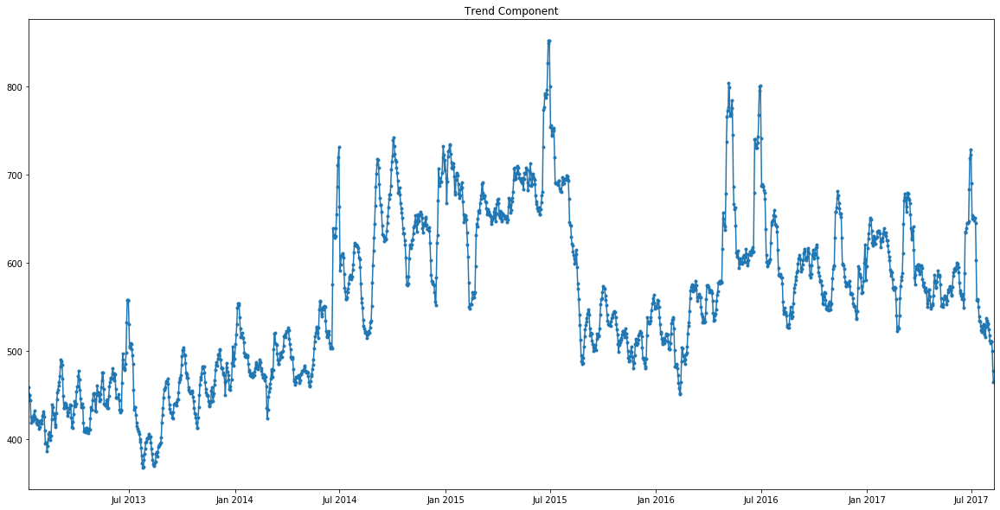

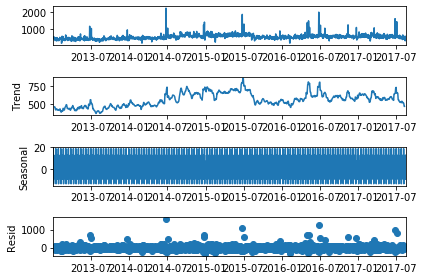

BREAD/BAKERY 38.0


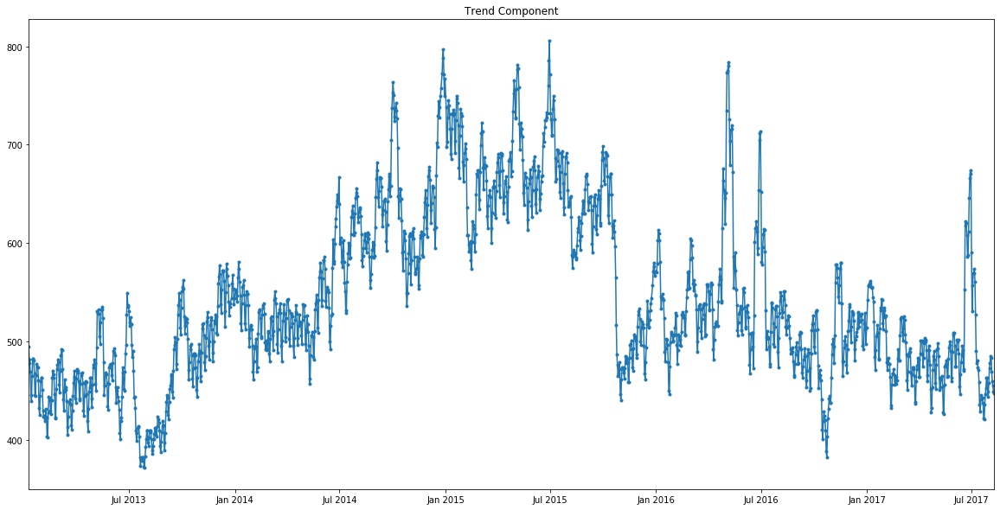

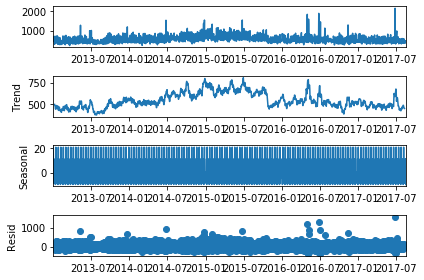

BREAD/BAKERY 44.0


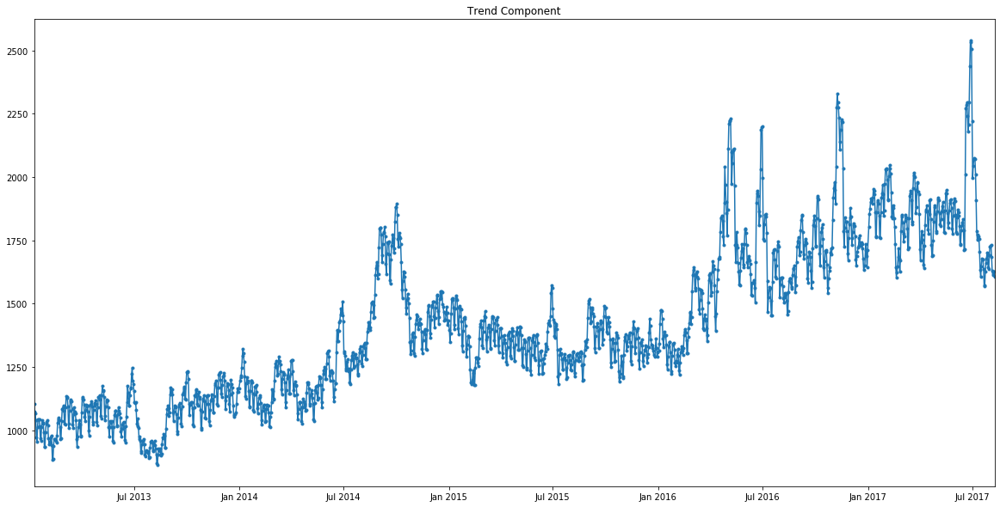

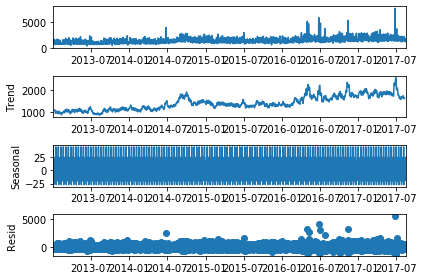

BREAD/BAKERY 50.0


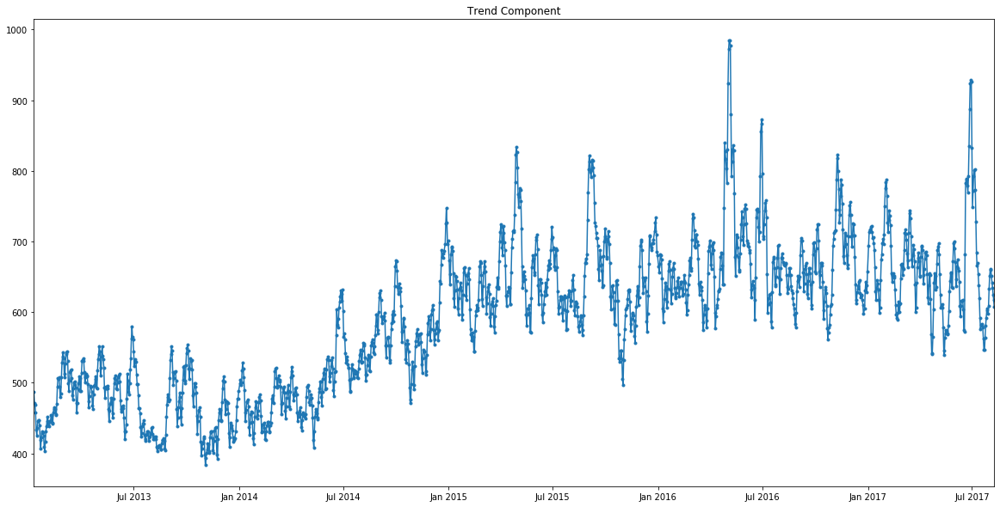

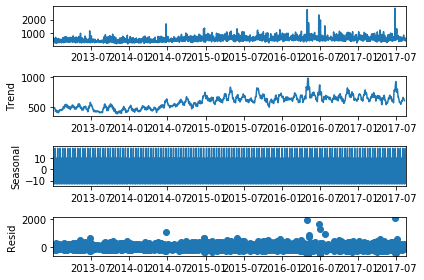

BREAD/BAKERY 51.0


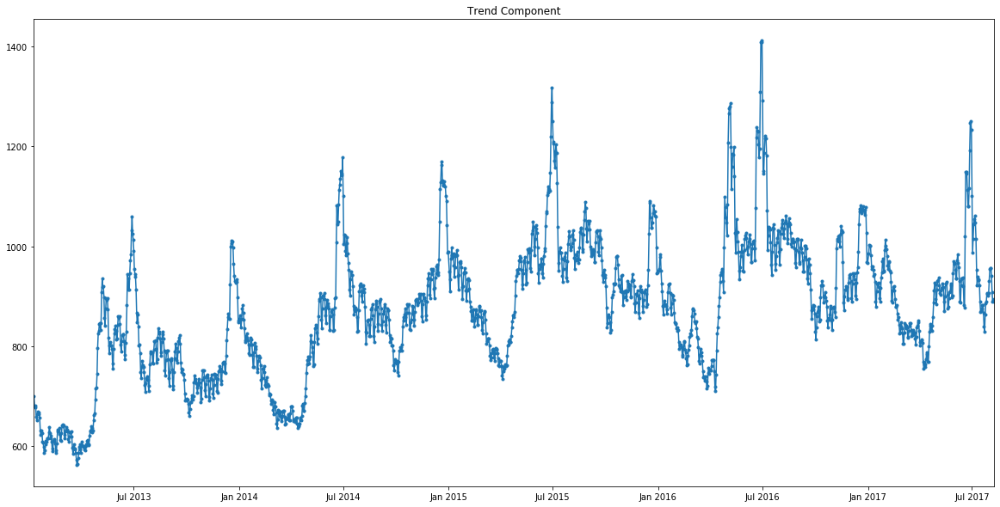

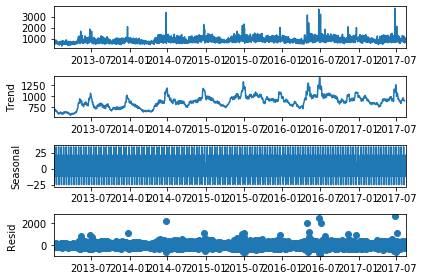

DAIRY 37.0


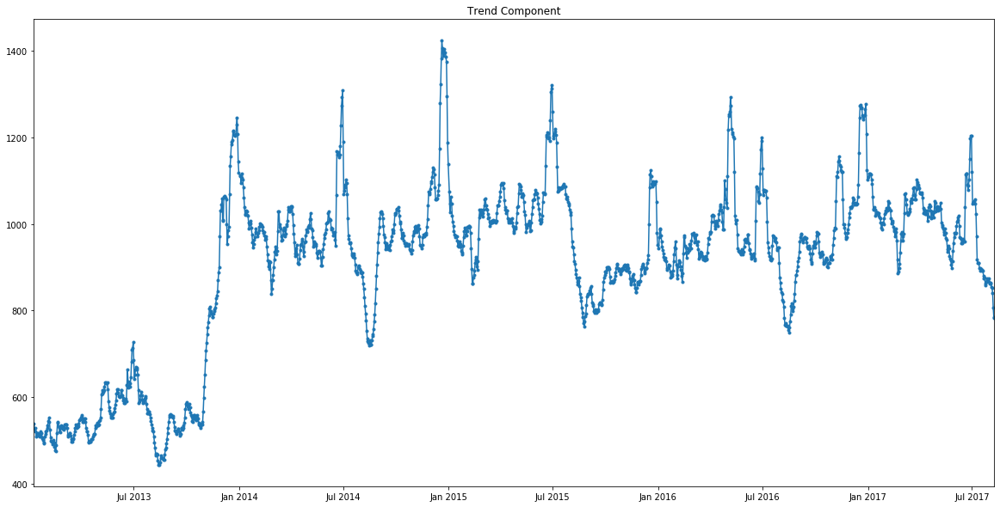

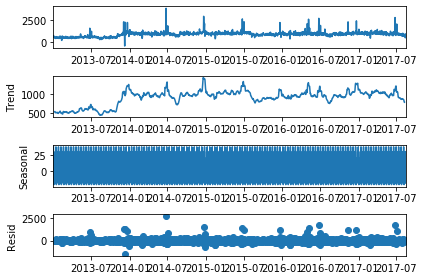

DAIRY 38.0


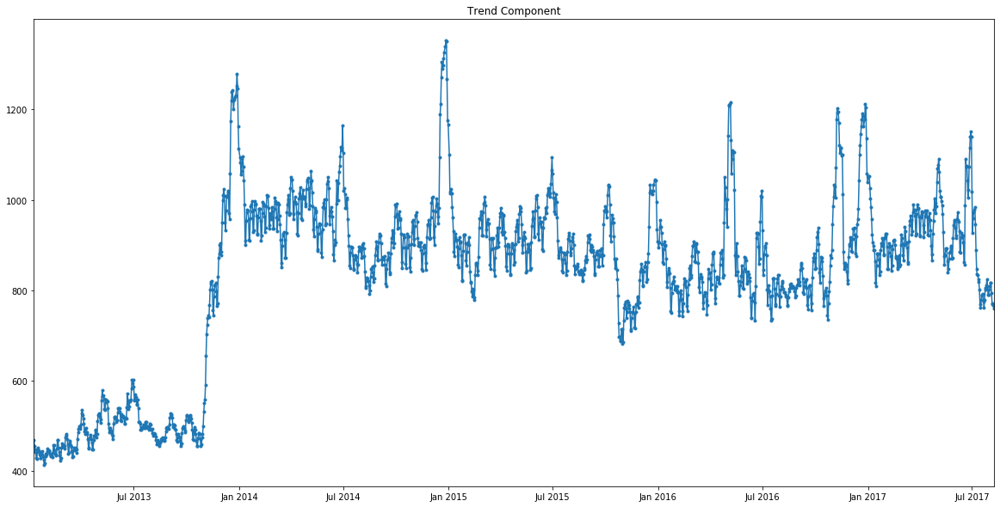

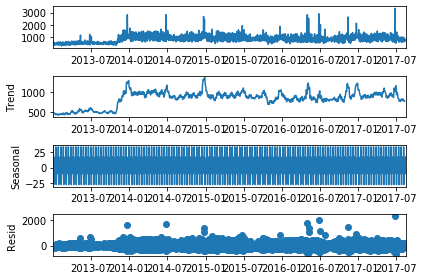

DAIRY 44.0


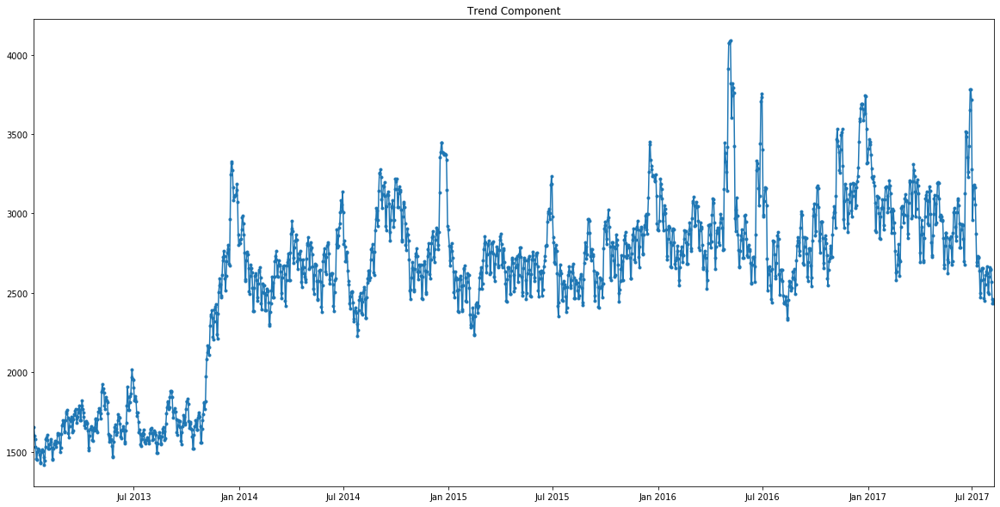

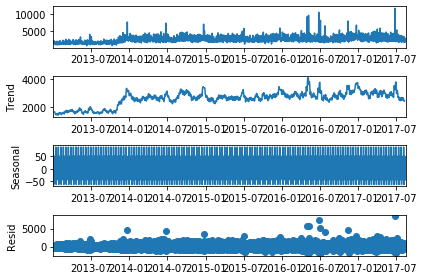

DAIRY 50.0


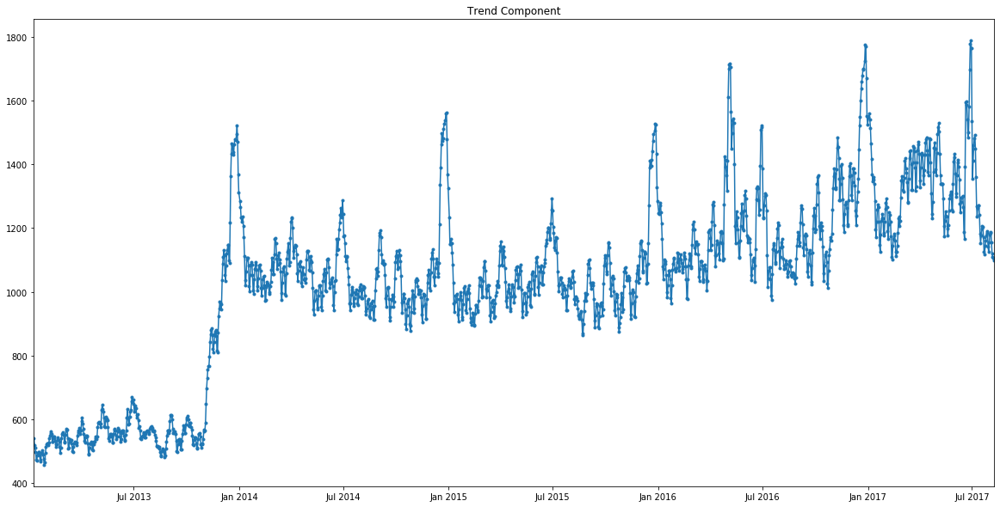

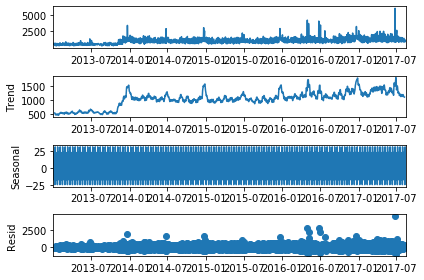

DAIRY 51.0


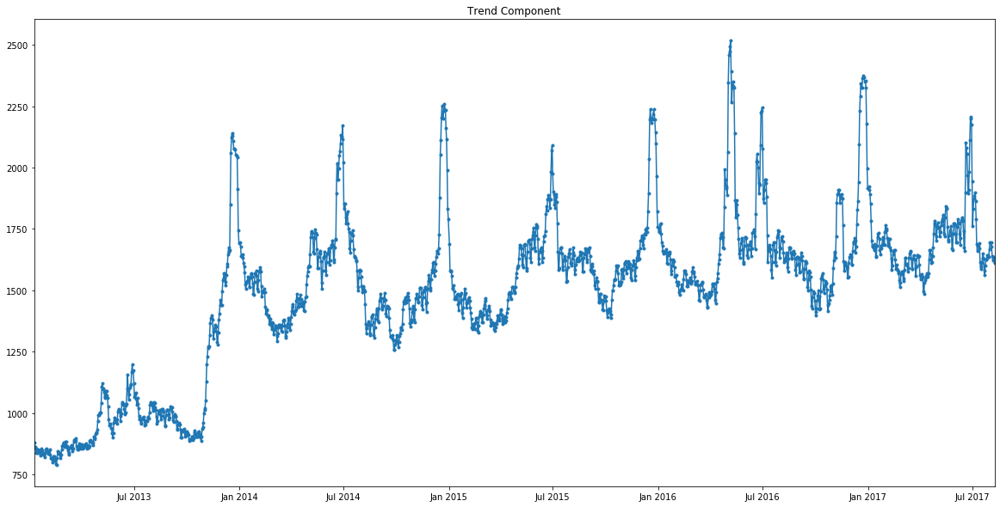

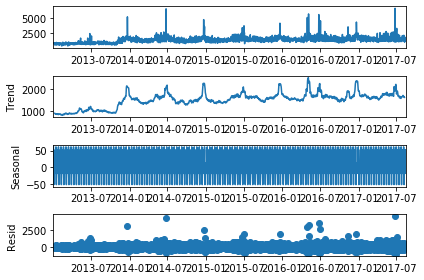

DELI 37.0


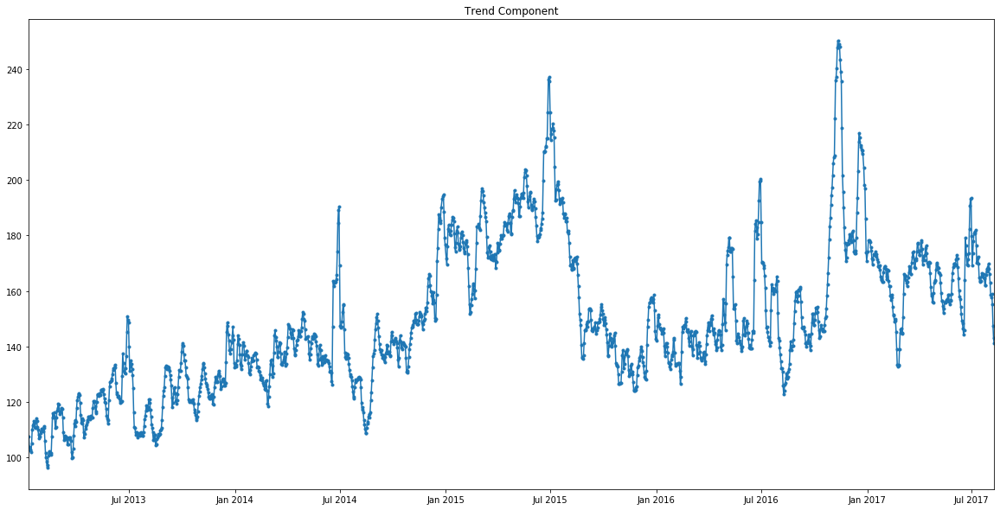

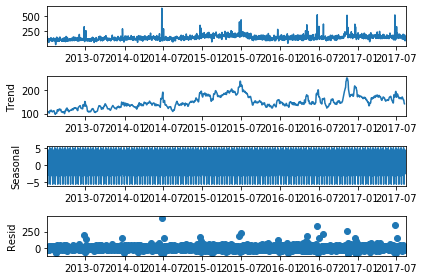

DELI 38.0


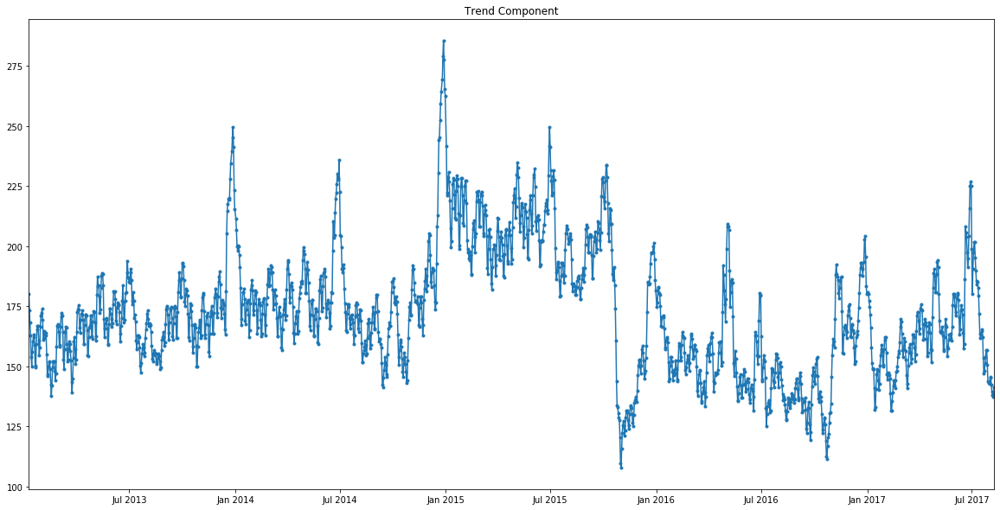

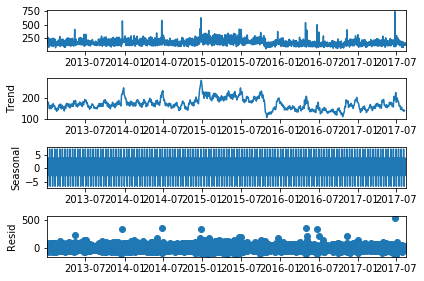

DELI 44.0


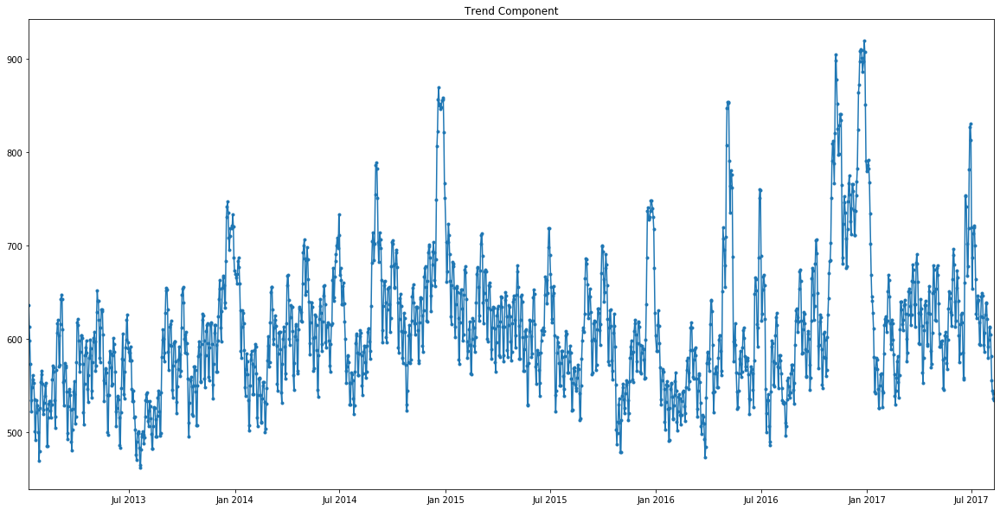

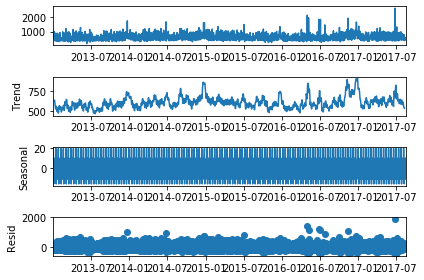

DELI 50.0


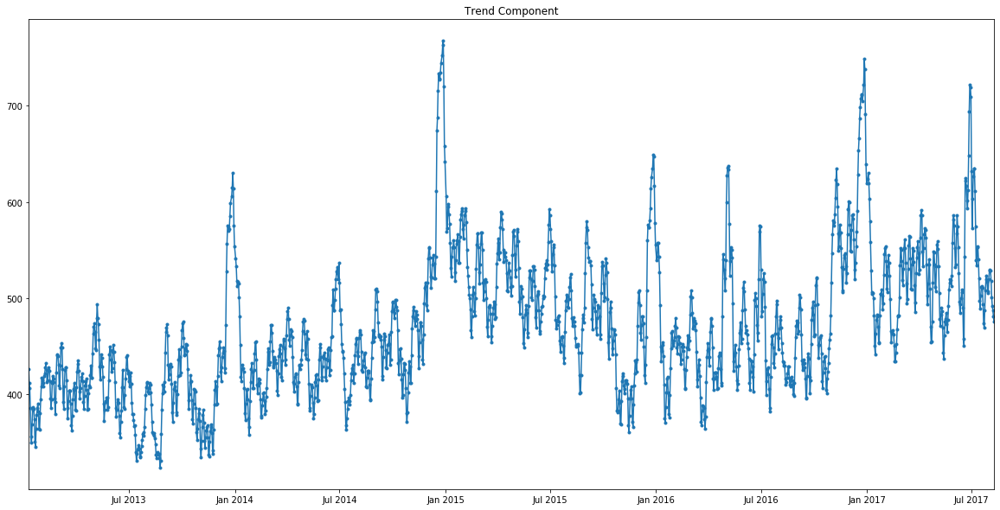

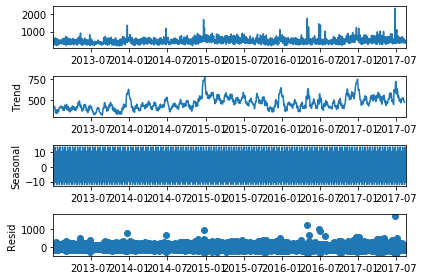

DELI 51.0


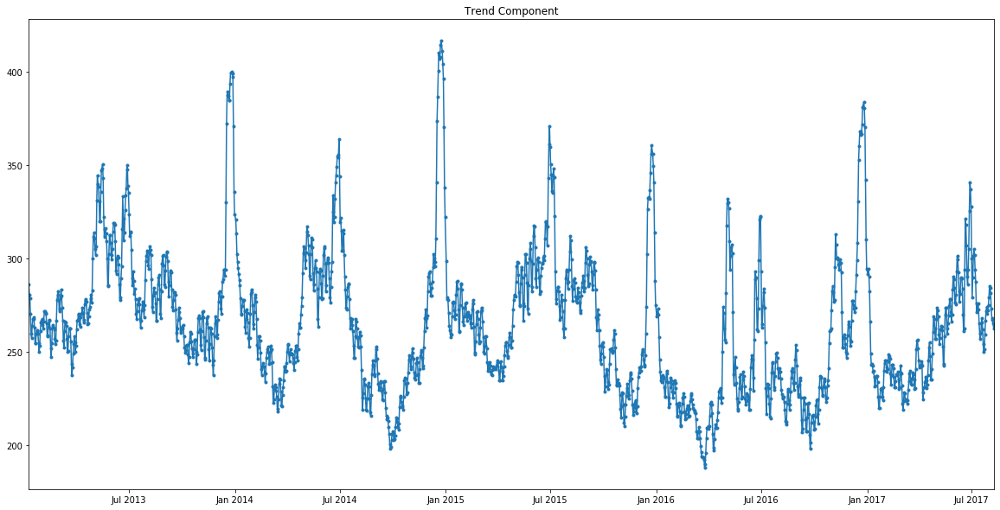

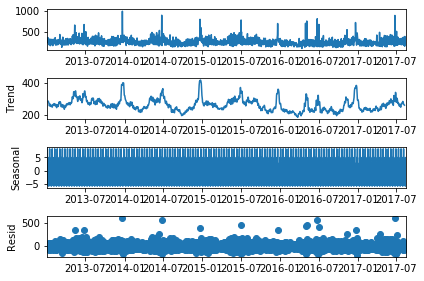

EGGS 37.0


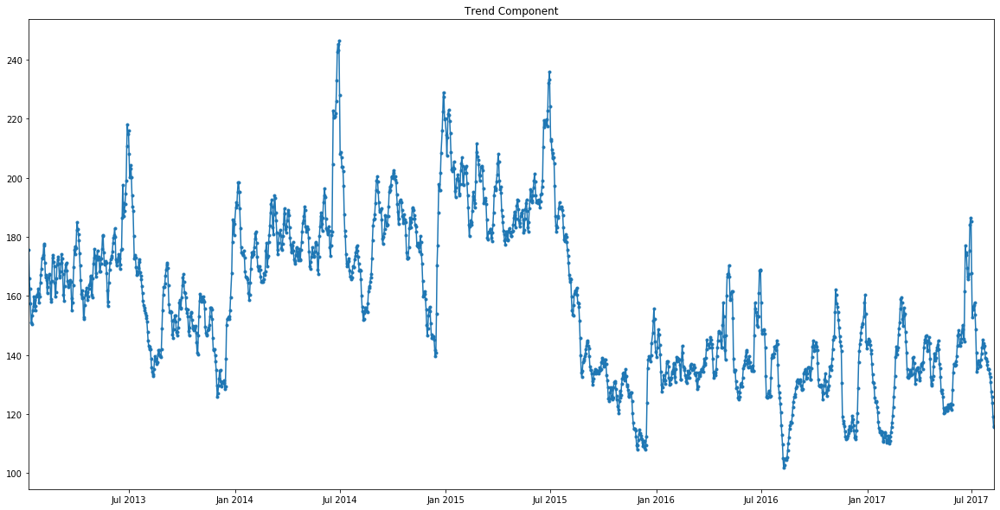

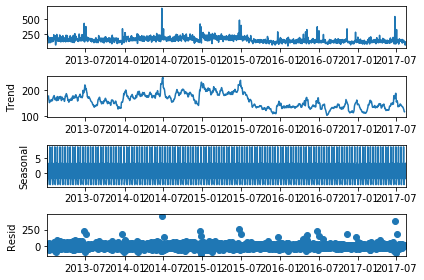

EGGS 38.0


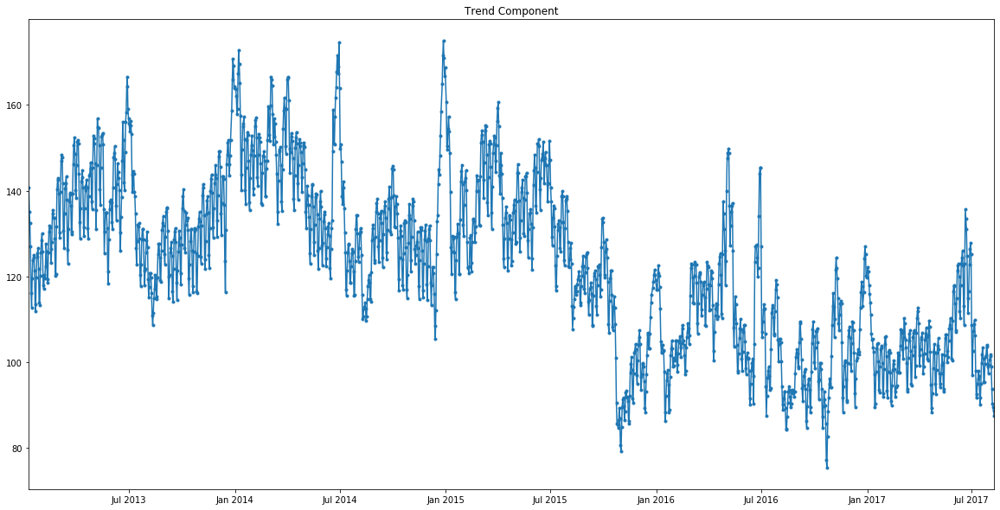

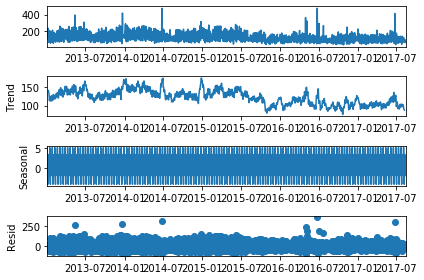

EGGS 44.0


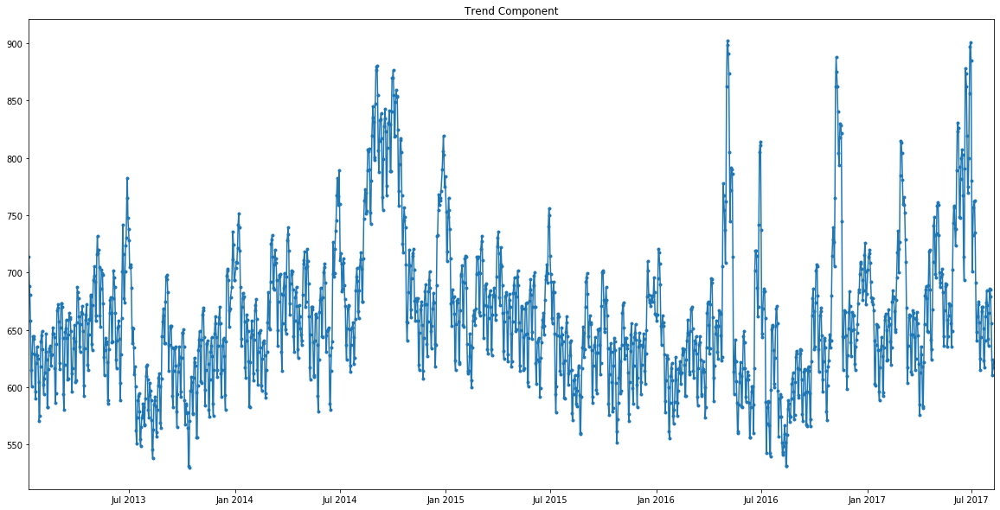

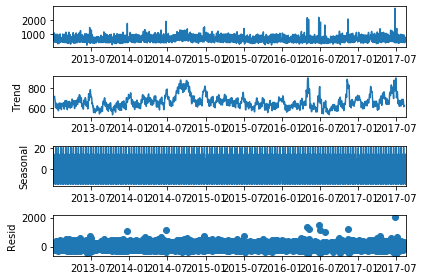

EGGS 50.0


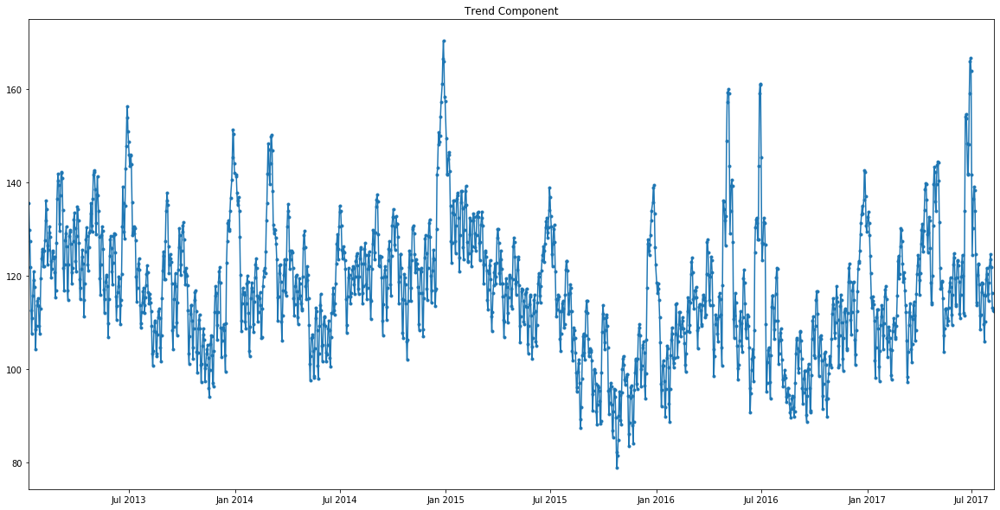

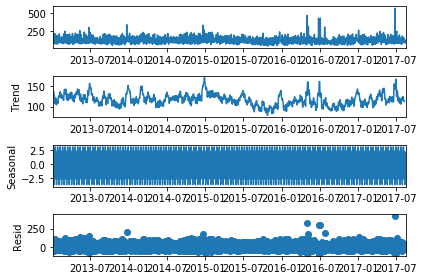

EGGS 51.0


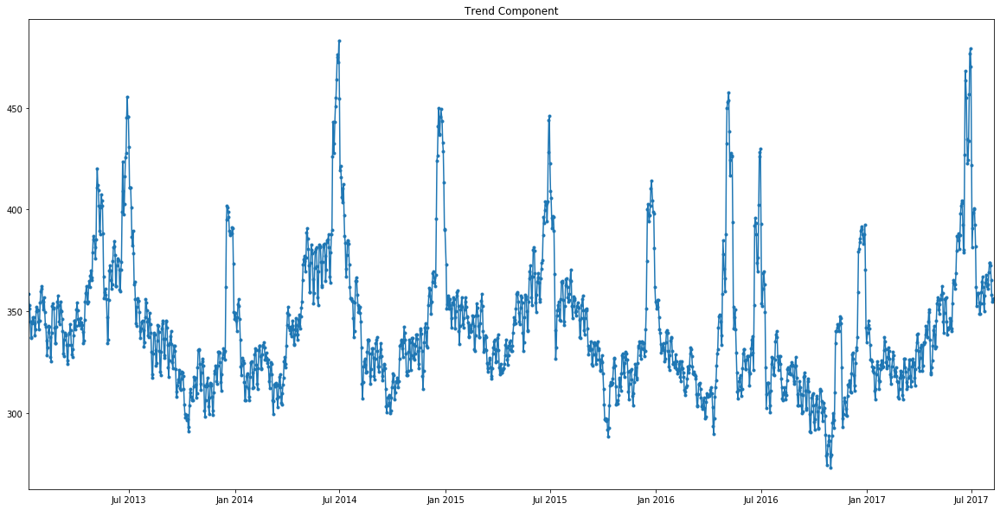

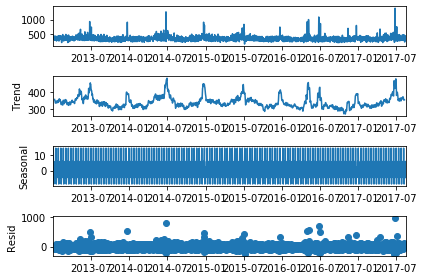

MEATS 37.0


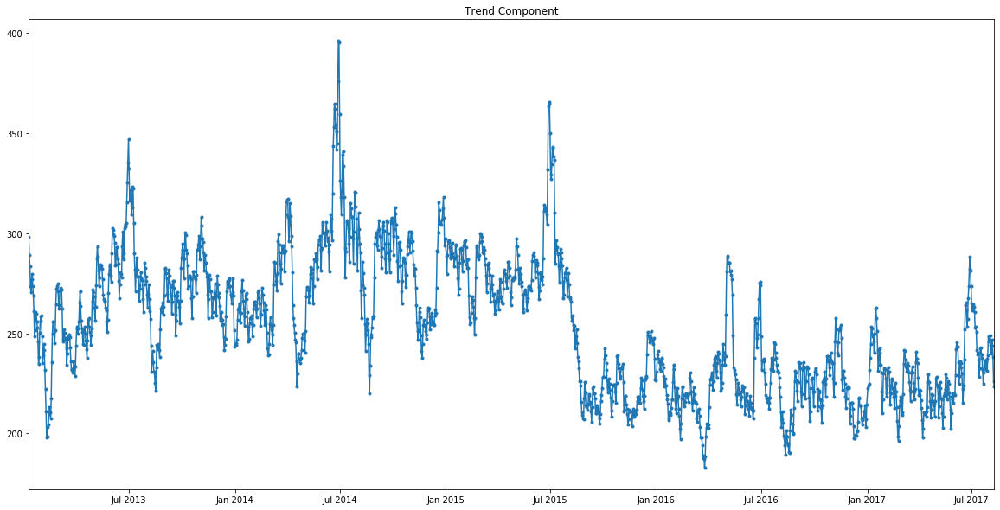

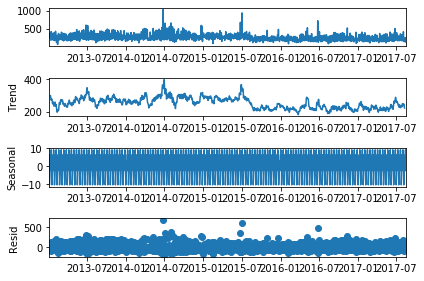

MEATS 38.0


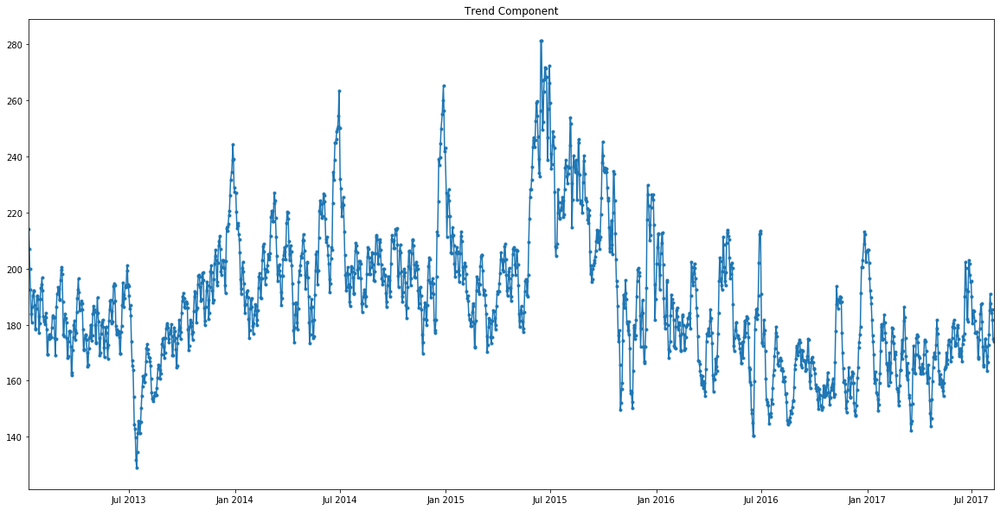

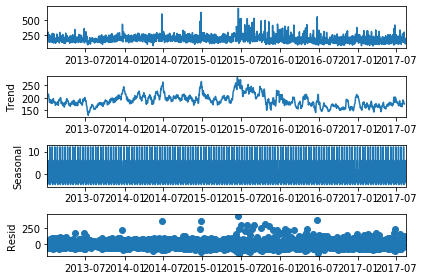

MEATS 44.0


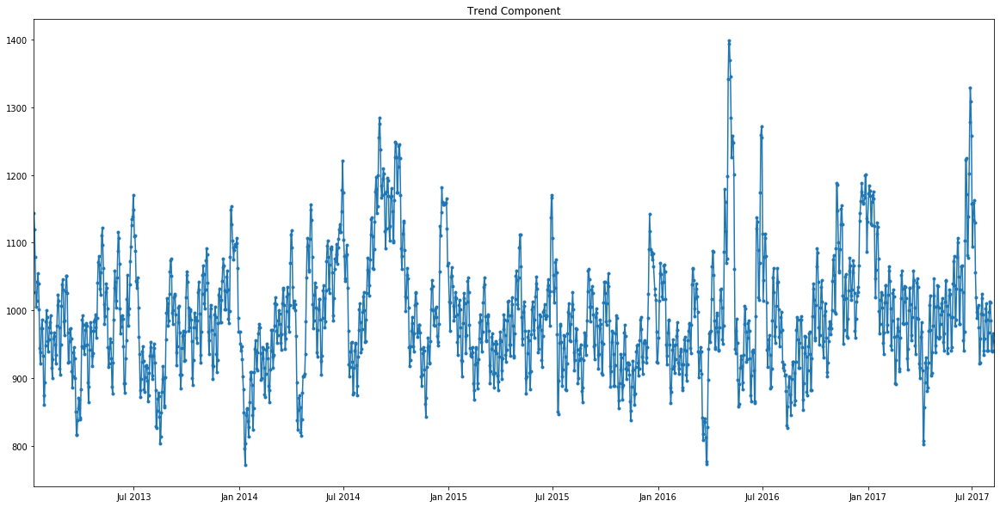

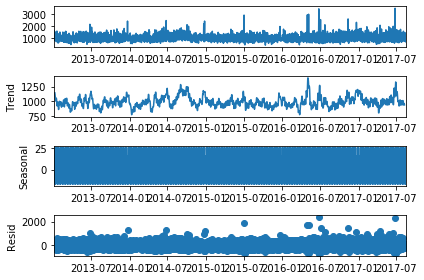

MEATS 50.0


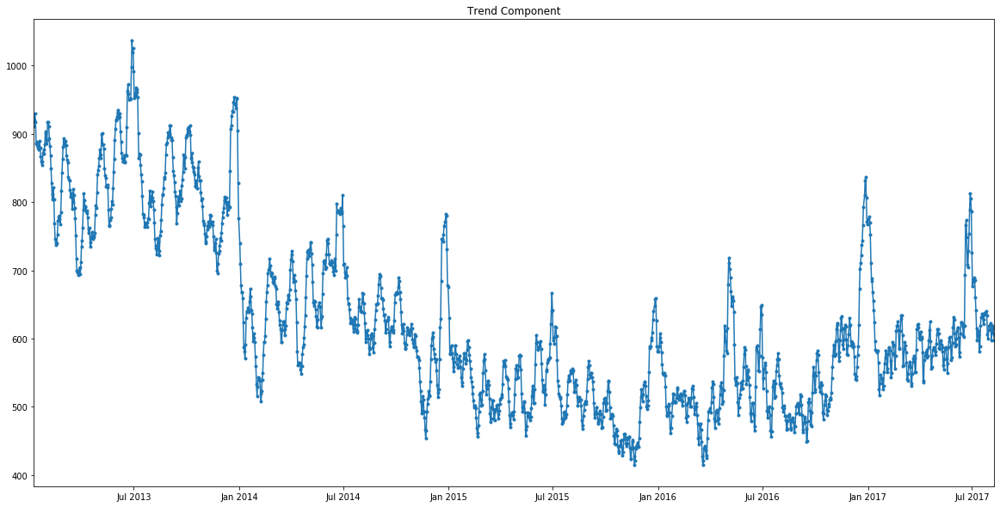

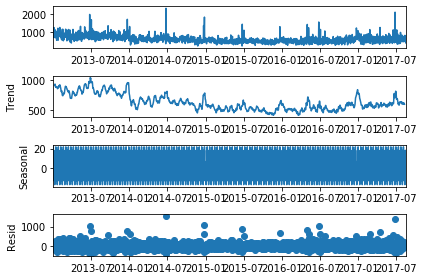

MEATS 51.0


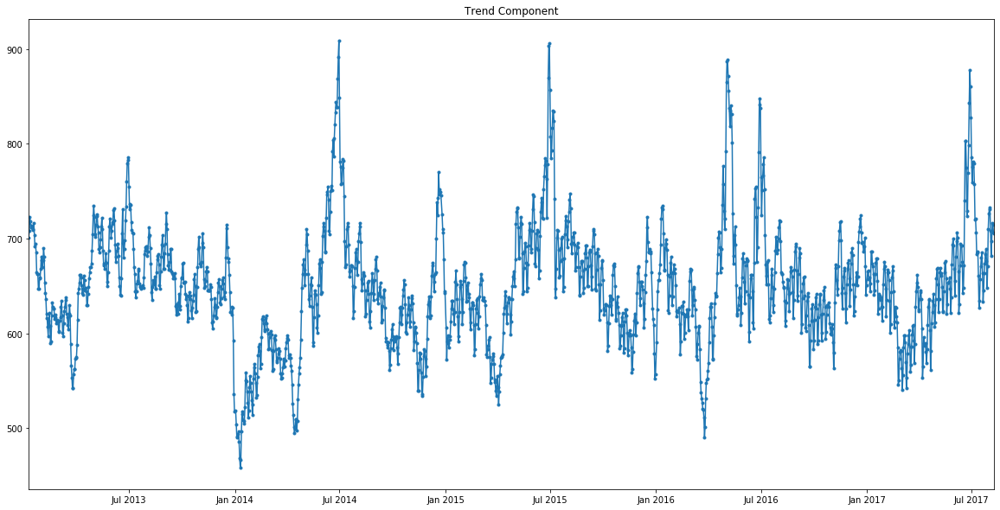

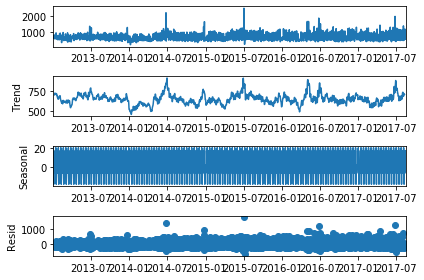

POULTRY 37.0


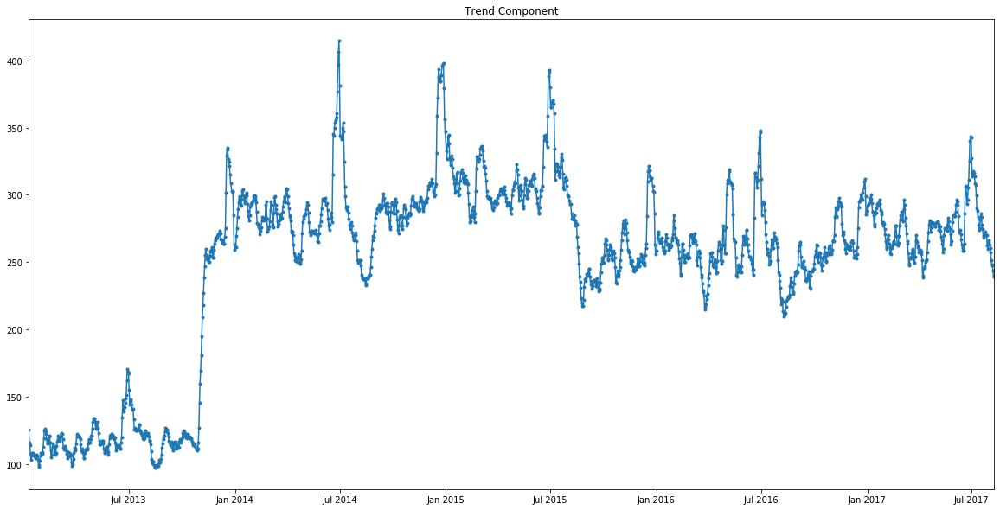

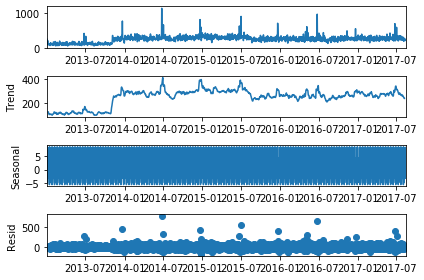

POULTRY 38.0


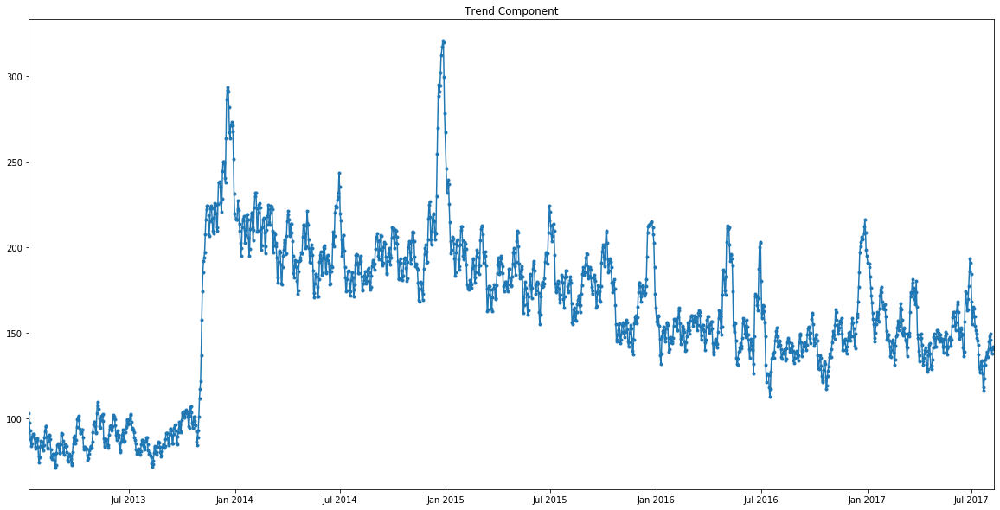

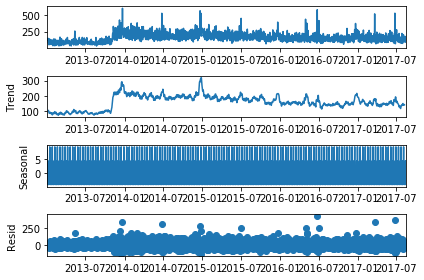

POULTRY 44.0


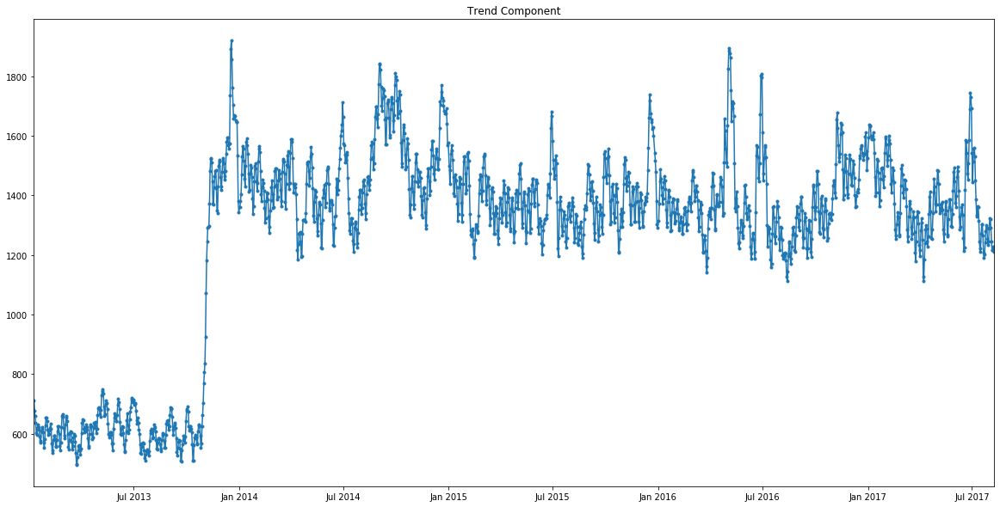

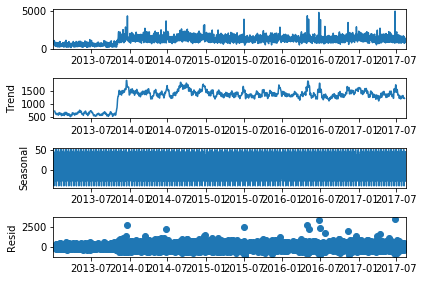

POULTRY 50.0


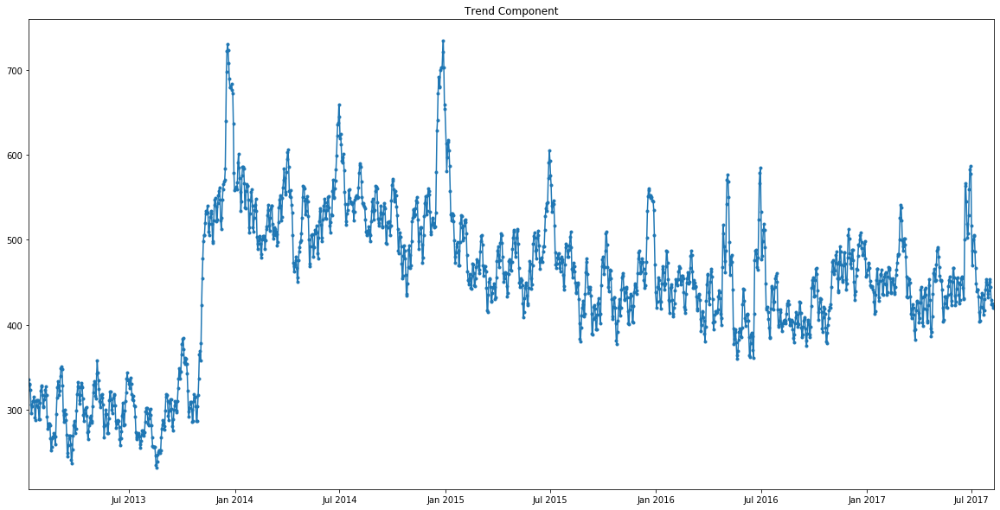

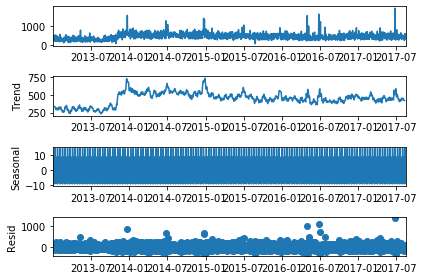

POULTRY 51.0


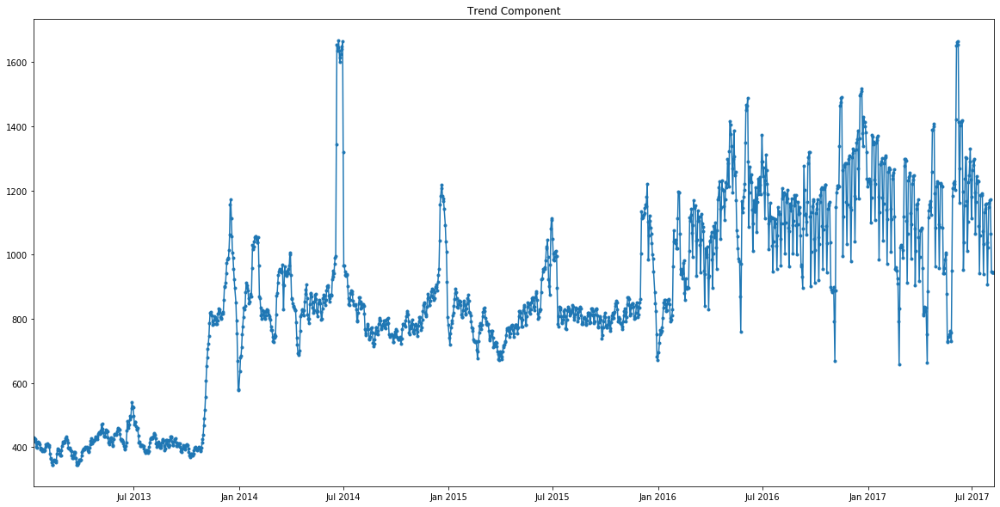

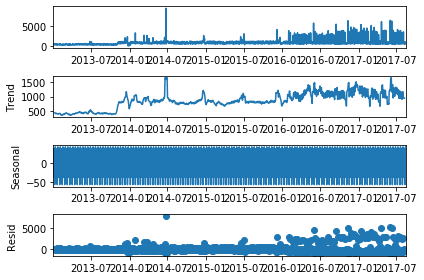

PREPARED FOODS 37.0


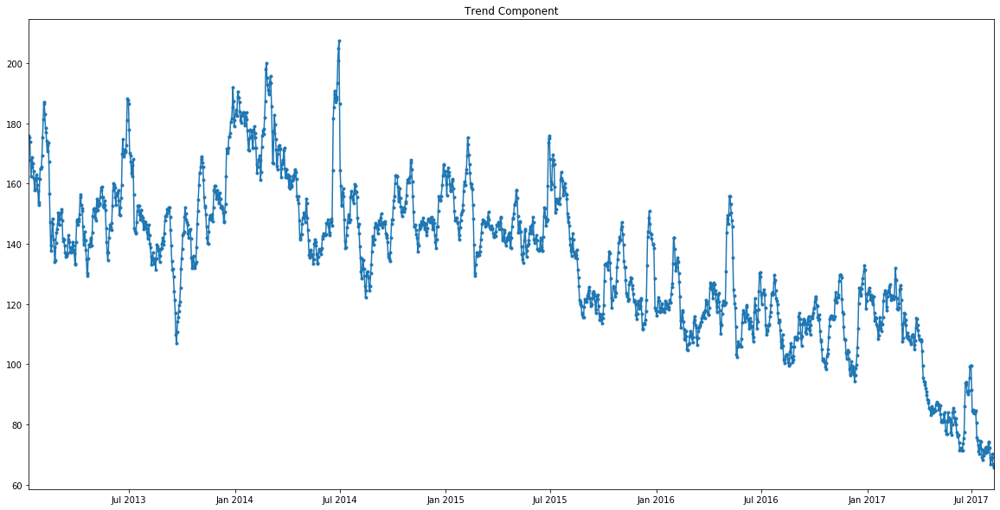

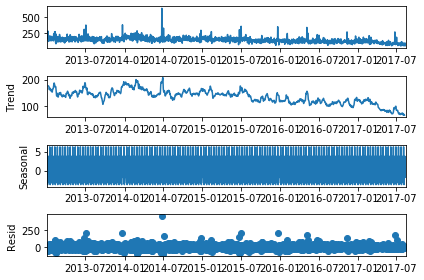

PREPARED FOODS 38.0


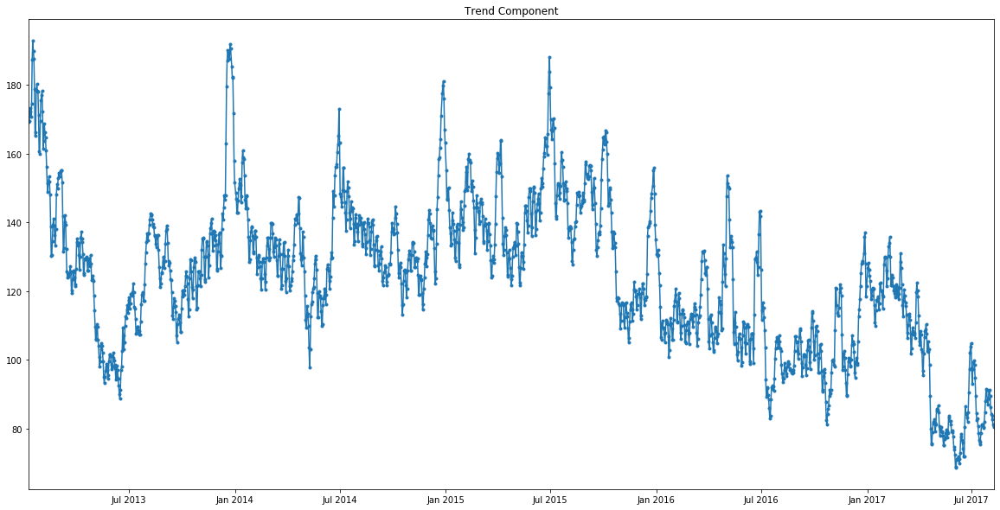

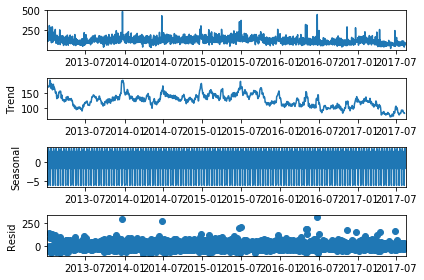

PREPARED FOODS 44.0


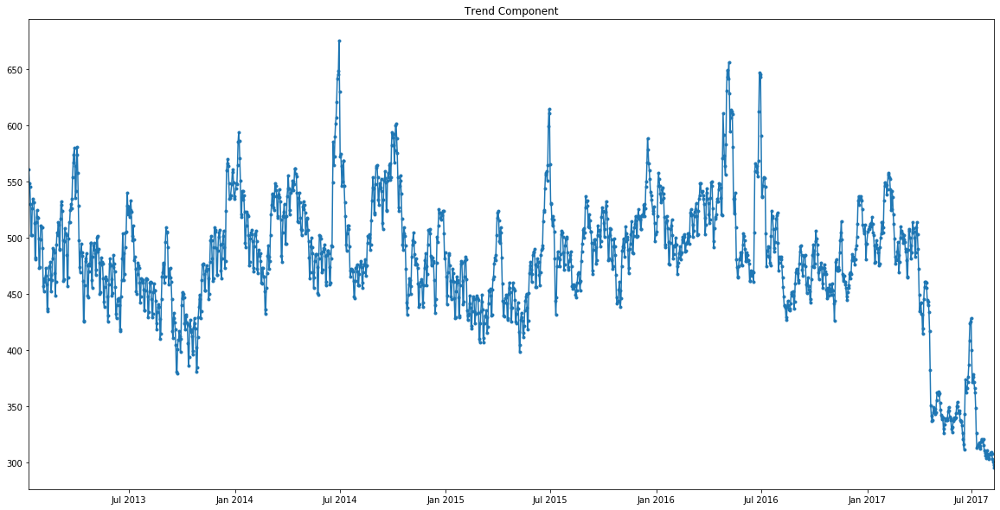

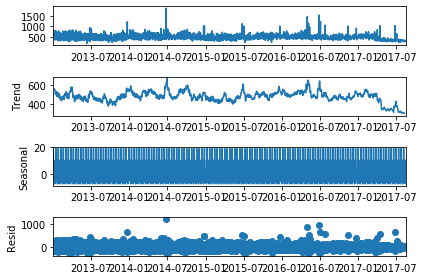

PREPARED FOODS 50.0


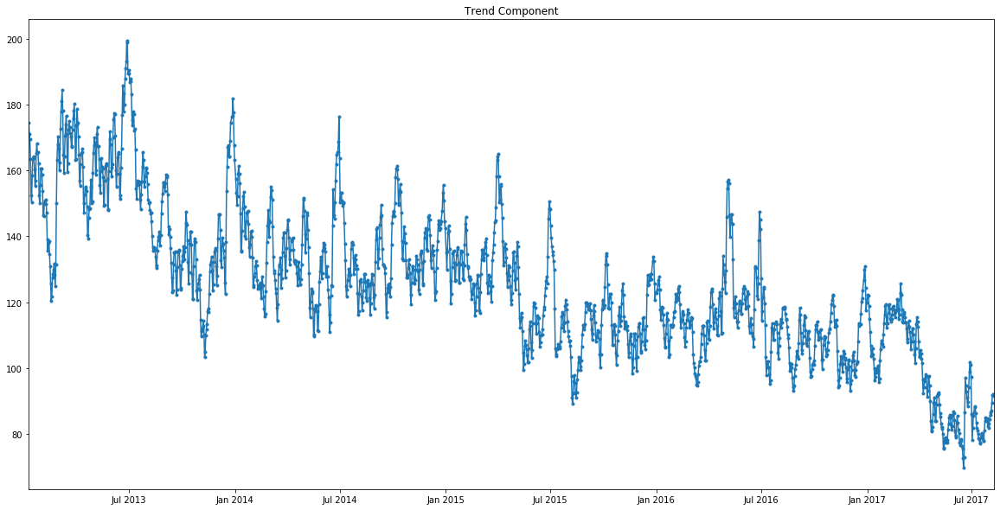

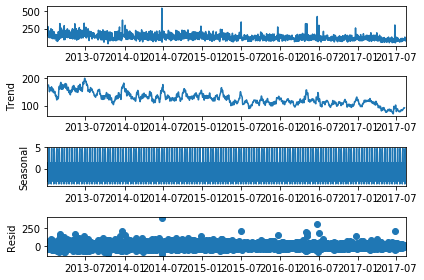

PREPARED FOODS 51.0


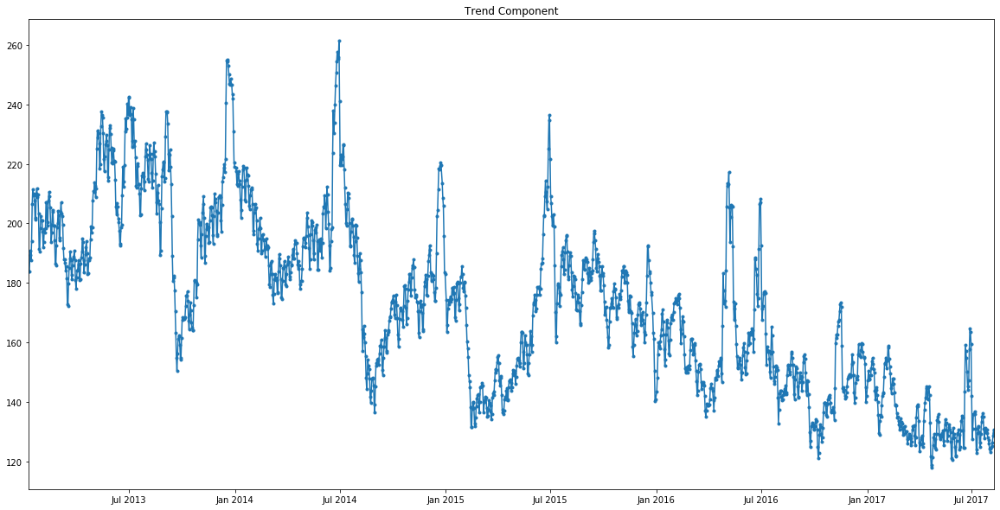

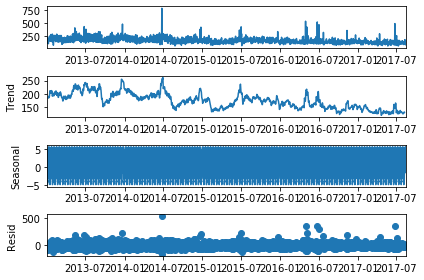

SEAFOOD 37.0


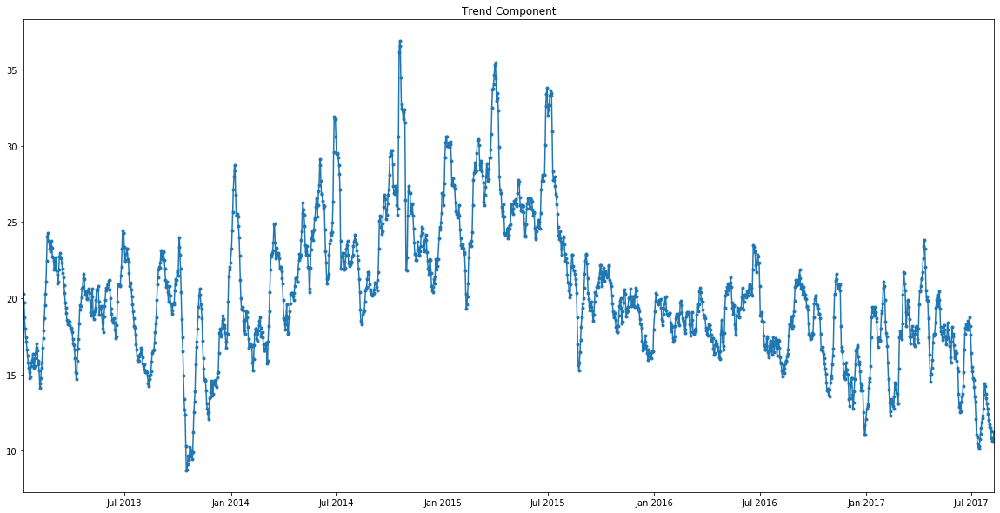

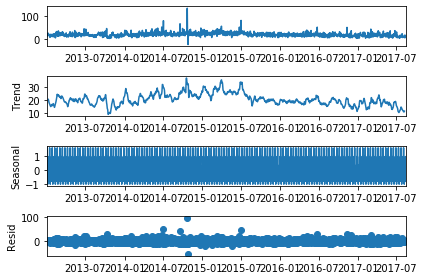

SEAFOOD 38.0


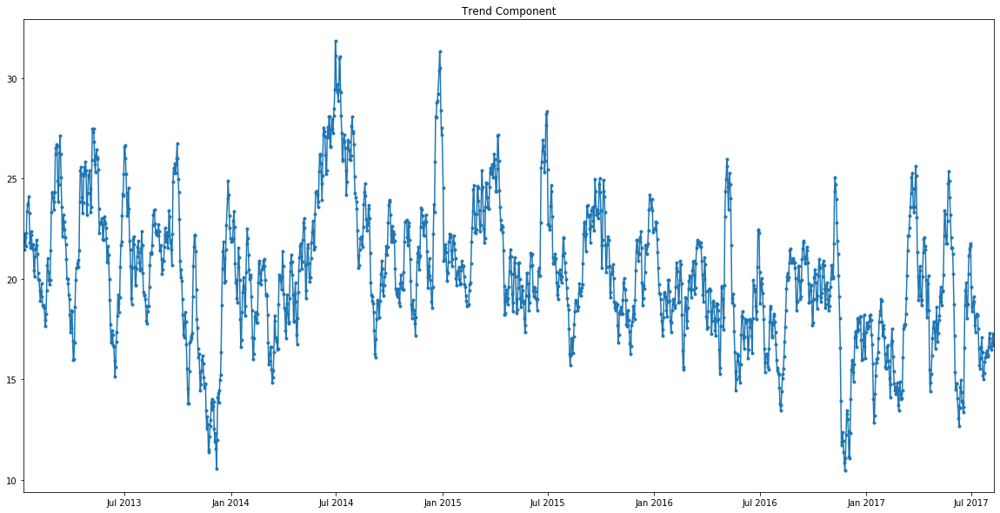

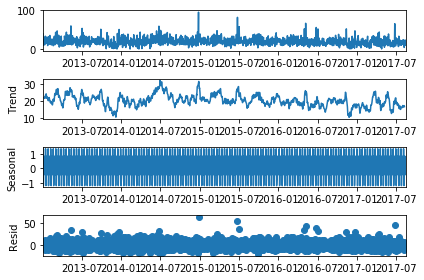

SEAFOOD 44.0


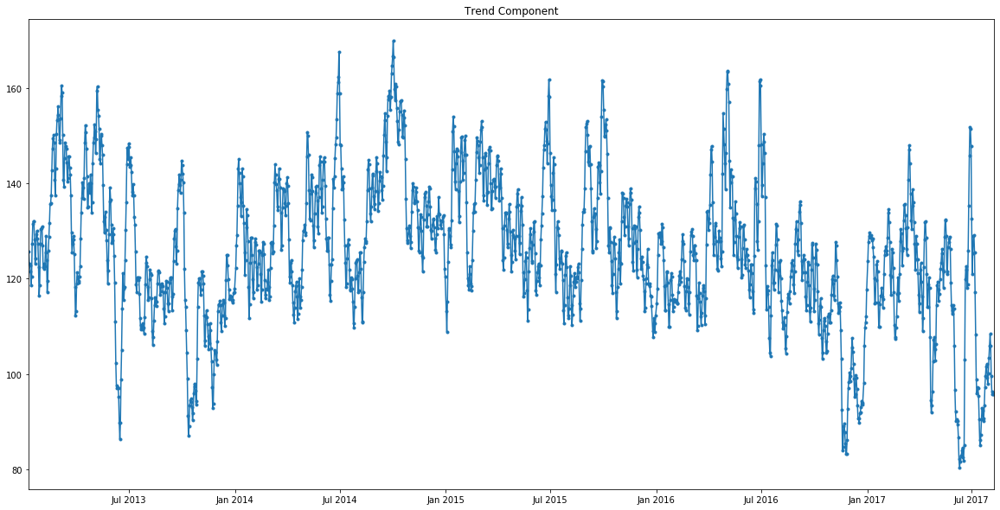

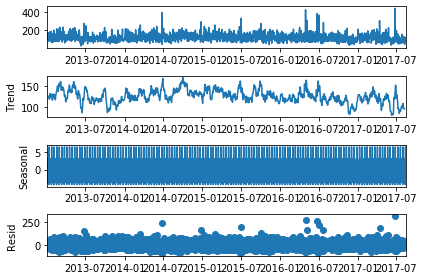

SEAFOOD 50.0


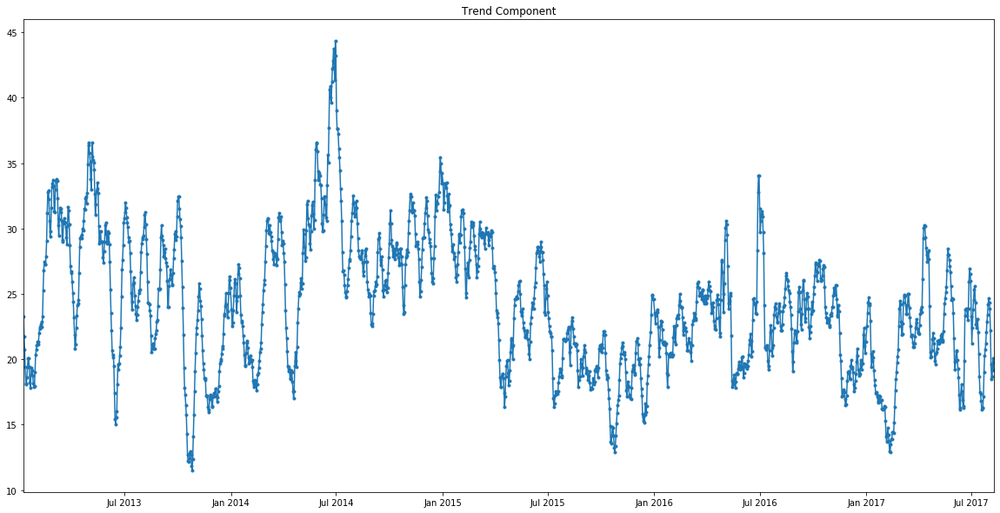

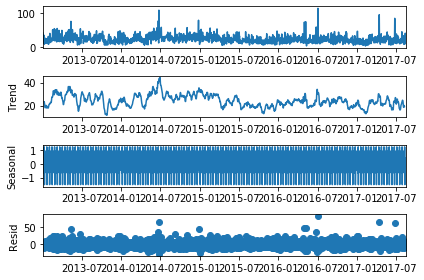

SEAFOOD 51.0


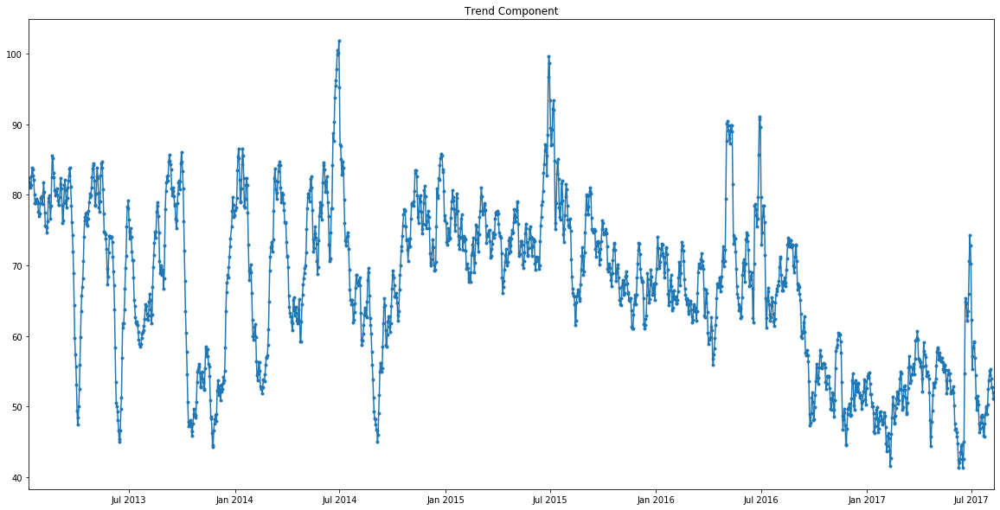

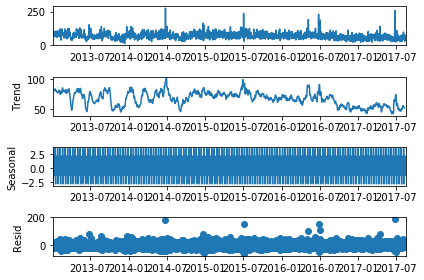

PRODUCE 37.0


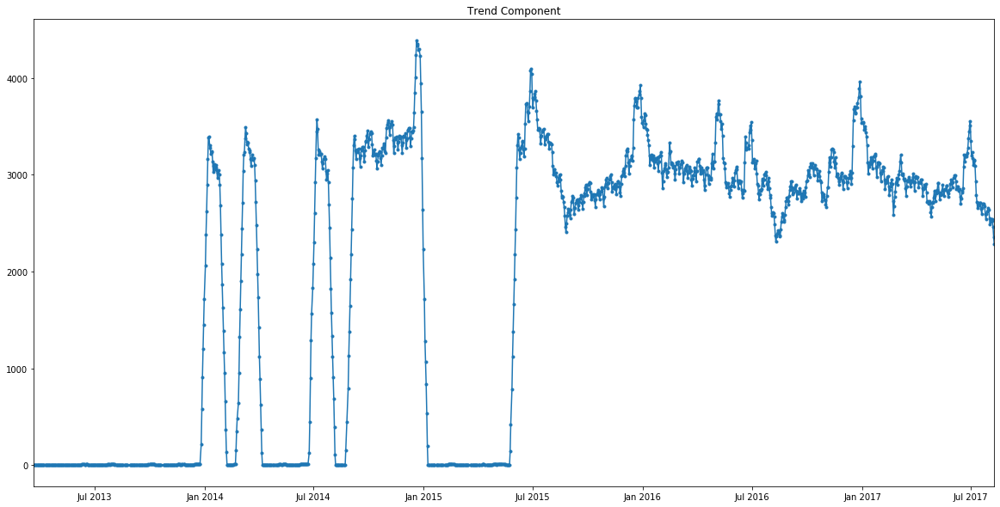

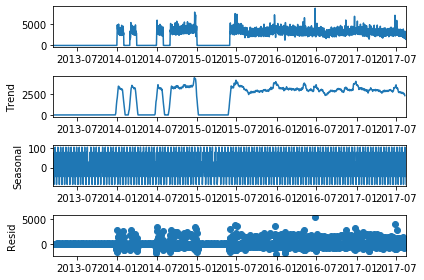

PRODUCE 38.0


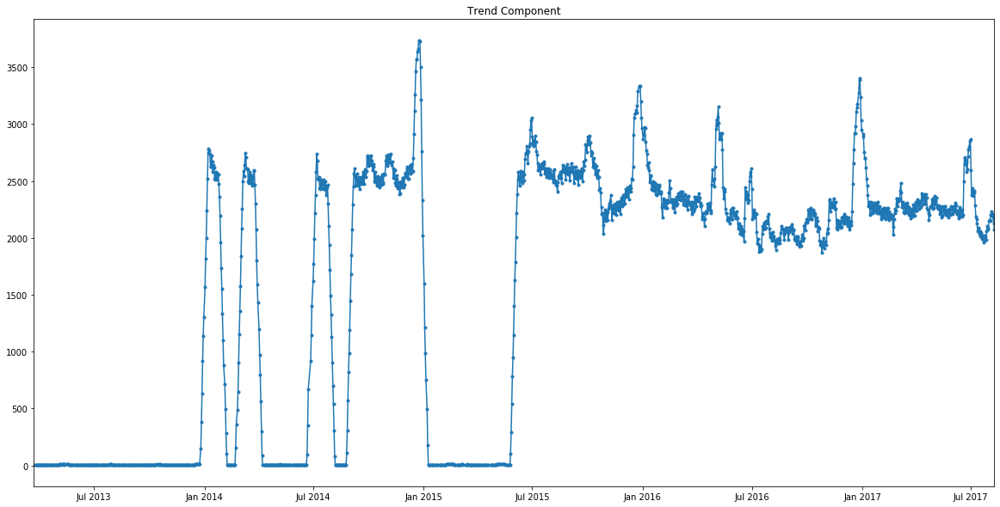

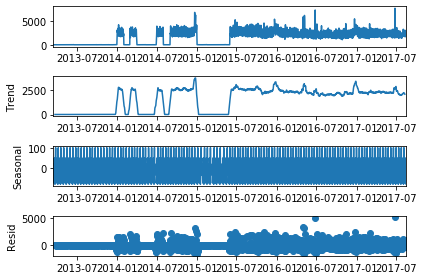

PRODUCE 44.0


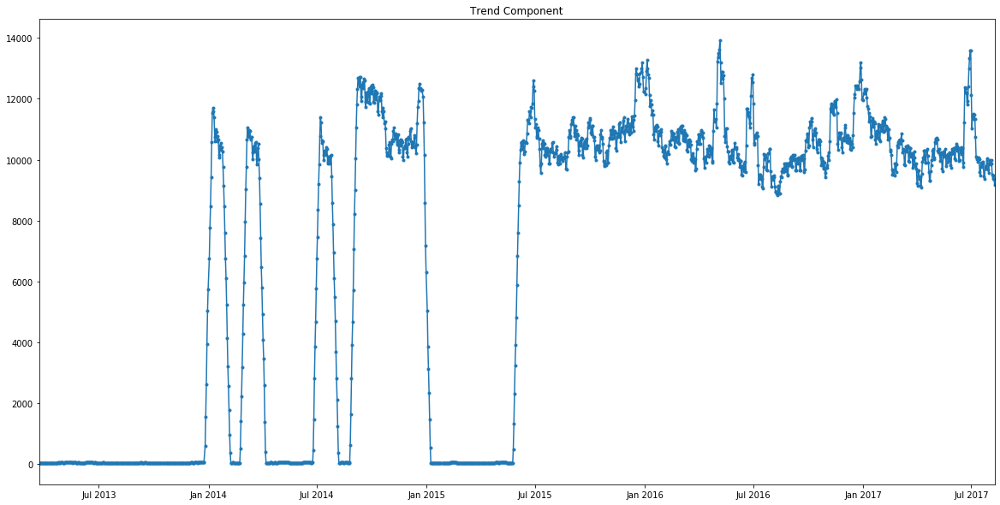

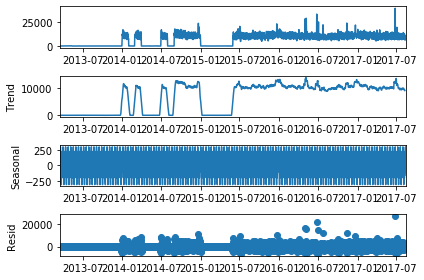

PRODUCE 50.0


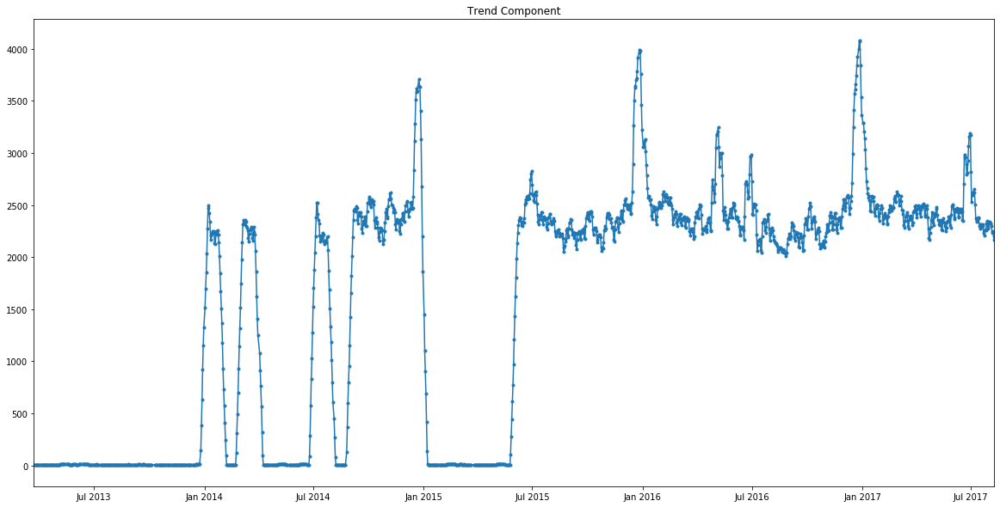

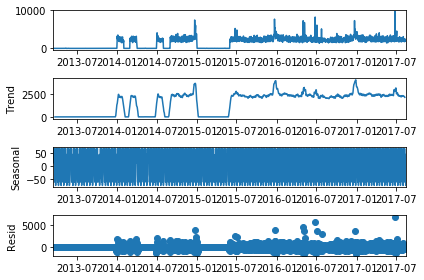

PRODUCE 51.0


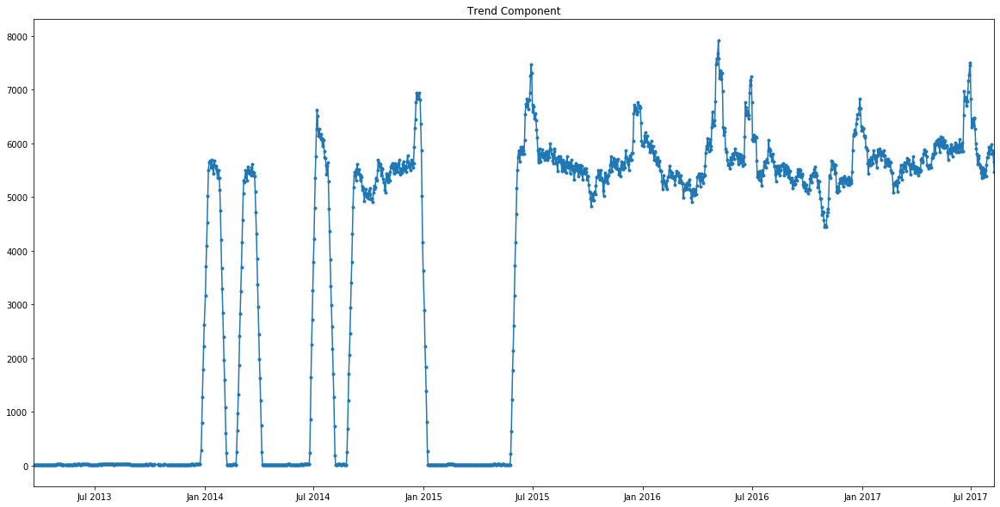

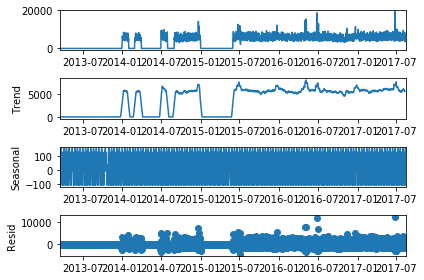

In [4]:
# Time series decomposition - import libraries
from statsmodels.api import tsa
from matplotlib.dates import DateFormatter

# create datetime index
final_date_index = final_new.set_index('date')

# keep list of stores and family
stores = final_new['store_nbr'].unique()
family = final_new['family'].unique()

for product in family:
    for store in stores:
        print(product, store)
        data = final_date_index[(final_date_index['family'] == product) & (final_date_index['store_nbr'] == store)]
        data_group = data[['unit_sales']]
        decomposition = tsa.seasonal_decompose(data_group, freq=12)

        # Trend
        plt.figure(figsize = (20,10))
        ax = plt.gca()
        plt.plot(decomposition.trend, marker='.')
        plt.title('Trend Component')
        ax.autoscale(enable=True, axis='x', tight=True)
        ax.xaxis.set_major_formatter(DateFormatter("%b %Y"))
        plt.show();

        fig = decomposition.plot()
        plt.show()

Produce has strange values. Model may not work well for produce - also fewer count of values than others- must be days where no produce was sold - not recorded or not available?

In [5]:
# Check for stationarity
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss

# KPSS null hypothesis = data is stationary (so want p > 0.05 to fail to reject)
# Adfuller null hypothesis hypothesis = data is not stationary (so want p < 0.05 to reject)

for store in stores:
    for product in family:
        data = final_date_index[(final_date_index['family'] == product) & (final_date_index['store_nbr'] == store)]
        X = data['unit_sales']
        resultad = adfuller(X)
        resultkp = kpss(X)
        print(product, store)
        print('ADF p-value: %f' % resultad[1])
        print('KPSS p-value: %f' % resultkp[1])

BREAD/BAKERY 37.0
ADF p-value: 0.007963
KPSS p-value: 0.010000
DAIRY 37.0
ADF p-value: 0.022391
KPSS p-value: 0.010000
DELI 37.0
ADF p-value: 0.004899
KPSS p-value: 0.010000
EGGS 37.0
ADF p-value: 0.005932
KPSS p-value: 0.010000
MEATS 37.0
ADF p-value: 0.003782
KPSS p-value: 0.010000
POULTRY 37.0
ADF p-value: 0.069086
KPSS p-value: 0.010000
PREPARED FOODS 37.0
ADF p-value: 0.206350
KPSS p-value: 0.010000
SEAFOOD 37.0
ADF p-value: 0.000012
KPSS p-value: 0.010000
PRODUCE 37.0
ADF p-value: 0.004181
KPSS p-value: 0.010000
BREAD/BAKERY 38.0
ADF p-value: 0.013470
KPSS p-value: 0.010000
DAIRY 38.0
ADF p-value: 0.017793
KPSS p-value: 0.010000
DELI 38.0
ADF p-value: 0.000429
KPSS p-value: 0.010000
EGGS 38.0
ADF p-value: 0.009822
KPSS p-value: 0.010000
MEATS 38.0
ADF p-value: 0.001336
KPSS p-value: 0.010000
POULTRY 38.0
ADF p-value: 0.030854
KPSS p-value: 0.010000
PREPARED FOODS 38.0
ADF p-value: 0.006213
KPSS p-value: 0.010000
SEAFOOD 38.0
ADF p-value: 0.000000
KPSS p-value: 0.010000
PRODUCE 38

Finding: Many not stationarity, may be able to fix with differencing but I will run a Facebook Prophet time series model that can deal with non-stationary data.

# Facebook Prophet

ARIMA models were run in R (see R markdown file) but the average MAPE of Facebook Prophet models was lower than the ARIMA models. R was used for the ARIMA models to take advantage of the "auto.arima" package that automatically determines the best values for the p (order/number of lags of the autoregressive model), d (degree of differencing), and q (order of the moving-average model) parameters.

In [6]:
# Import libraries
from fbprophet import Prophet
from fbprophet.plot import plot_cross_validation_metric 
from fbprophet.diagnostics import performance_metrics
from fbprophet.diagnostics import cross_validation
from scipy.signal import medfilt
from sklearn.metrics import mean_absolute_error

# Import MAPE formula for model evaluation
#source: https://stats.stackexchange.com/questions/58391/mean-absolute-percentage-error-mape-in-scikit-learn
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [7]:
# Define function to run prophet model for each store and product group using time feature and additional regressors
# additional regressors = holidays, average temperature, total precipitation, and # of items in category on promotion

def make_prediction_add_regressors(df,store_nbr,family):
    data = df[(df['family'] == family)&(df['store_nbr']== store_nbr)].reset_index(drop=True)
    data = data[['date','unit_sales']]
    data.rename(columns = {'date':'ds','unit_sales':'y'}, inplace=True)
    
    # Get rid of outliers with median filter
    data_med = medfilt(data['y'])
    data['y']=data_med
    
    # Holiday
    holiday = df[['date','holiday']]
    holiday = holiday.drop_duplicates(subset='date', keep='first').reset_index(drop=True)

    # Temp
    avgtemp = df[['date','avgtemp']]
    avgtemp = avgtemp.drop_duplicates(subset='date', keep='first').reset_index(drop=True)

    # Precip
    precipMM = df[['date','precipMM']]
    precipMM = precipMM.drop_duplicates(subset='date', keep='first').reset_index(drop=True)

    # onpromotion
    onpromotion = df[['date','onpromotion']]
    onpromotion  = onpromotion .drop_duplicates(subset='date', keep='first').reset_index(drop=True)

    dfs = [data,holiday,avgtemp,precipMM,onpromotion]
    data_with_regressors = pd.concat(dfs,axis = 1)
    data_with_regressors.drop(columns = 'date', inplace=True)
    
    # Split into train and test
    data_with_regressors_train = data_with_regressors[data_with_regressors['ds'].dt.year != 2017]
    data_with_regressors_test = data_with_regressors[data_with_regressors['ds'].dt.year == 2017]
    
    # Initiate and fit model
    m_reg = Prophet()

    # Add regressors
    m_reg.add_regressor('holiday', prior_scale=0.5, mode = 'multiplicative')
    m_reg.add_regressor('avgtemp',prior_scale=0.5, mode = 'multiplicative')
    m_reg.add_regressor('precipMM',prior_scale=0.5, mode = 'multiplicative')
    m_reg.add_regressor('onpromotion',prior_scale=0.5, mode = 'multiplicative')

    m_reg.fit(data_with_regressors_train)

    data_with_regressors_test.dropna(inplace = True)
    
    forecast = m_reg.predict(data_with_regressors_test)
    mae = mean_absolute_error(y_true=data_with_regressors_test['y'].values,y_pred=forecast['yhat'].values)
    mape = mean_absolute_percentage_error(y_true=data_with_regressors_test['y'].values, y_pred=forecast['yhat'].values)
    results_reg = {'mae': [mae], 'mape':[mape], 'store': [store_nbr], 'family' :[family]}
    global results_reg2
    results_reg2 = pd.DataFrame(results_reg)
    return results_reg2 

In [8]:
# Calculate MAE AND MAPE for every store and product combination
mapes = pd.DataFrame(columns = ['mae', 'mape', 'store', 'family'])
for store in stores:
    for product in family:
        print(store,product)
        make_prediction_add_regressors(final_new,store,product)
        mapes = pd.concat([mapes, results_reg2],axis = 0)

INFO:numexpr.utils:NumExpr defaulting to 4 threads.


37.0 BREAD/BAKERY


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


37.0 DAIRY


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


37.0 DELI


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


37.0 EGGS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


37.0 MEATS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


37.0 POULTRY


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


37.0 PREPARED FOODS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


37.0 SEAFOOD


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


37.0 PRODUCE


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


38.0 BREAD/BAKERY


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


38.0 DAIRY


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


38.0 DELI


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


38.0 EGGS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


38.0 MEATS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


38.0 POULTRY


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


38.0 PREPARED FOODS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


38.0 SEAFOOD


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


38.0 PRODUCE


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


44.0 BREAD/BAKERY


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


44.0 DAIRY


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


44.0 DELI


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


44.0 EGGS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


44.0 MEATS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


44.0 POULTRY


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


44.0 PREPARED FOODS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


44.0 SEAFOOD


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


44.0 PRODUCE


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


50.0 BREAD/BAKERY
50.0 DAIRY


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


50.0 DELI


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


50.0 EGGS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


50.0 MEATS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


50.0 POULTRY


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


50.0 PREPARED FOODS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


50.0 SEAFOOD


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


50.0 PRODUCE


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


51.0 BREAD/BAKERY


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


51.0 DAIRY


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


51.0 DELI


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


51.0 EGGS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


51.0 MEATS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


51.0 POULTRY


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


51.0 PREPARED FOODS


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


51.0 SEAFOOD


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


51.0 PRODUCE


In [9]:
# Let's see what the MAPEs are
mapes

,mae,mape,store,family
0,70.529699,13.415391,37.0,BREAD/BAKERY
0,98.452334,11.013044,37.0,DAIRY
0,48.041452,32.454605,37.0,DELI
0,23.491343,19.231668,37.0,EGGS
0,27.127888,11.770680,37.0,MEATS
0,23.097907,8.906183,37.0,POULTRY
0,21.401789,26.693310,37.0,PREPARED FOODS
0,4.067391,31.667059,37.0,SEAFOOD
0,477.729789,17.686352,37.0,PRODUCE
0,61.506241,12.519654,38.0,BREAD/BAKERY


In [10]:
# calculate average MAPE of all Prophet Models
mapes['mape'].describe()

count    45.000000
mean     16.601652
std       6.759453
min       8.251219
25%      11.770680
50%      13.307308
75%      20.377395
max      38.645942
Name: mape, dtype: float64

Finding: Average MAPE is 16.6%

In [11]:
# What is the average MAPE per store? Do some perform better than others?
mapes.groupby('store').mean()['mape']

store
37.0    19.204255
38.0    17.821848
44.0    15.186121
50.0    17.334043
51.0    13.461994
Name: mape, dtype: float64

Overall, the average MAPE is lowest for store 51 and highest for store 37 (difference of approx 6%)

In [12]:
# What is the average MAPE per product? Do some perform better than others?
mapes.groupby('family').mean()['mape']

family
BREAD/BAKERY      11.859086
DAIRY             11.116291
DELI              19.346086
EGGS              13.948001
MEATS             12.468125
POULTRY           13.573921
PREPARED FOODS    19.676550
PRODUCE           21.083317
SEAFOOD           26.343493
Name: mape, dtype: float64

Overall, the average MAPE is lowest for dairy and highest for seafood (difference of approx 15%)

The higher MAPE for store 37 and for seafood could be due to the amount of data - store 37 had the second lowest number of sales compared to the other stores and seafood had the lowest number of sales compared to the other products. 

# Optimization of Facebook Prophet Model 

Because there are 45 separate models (each store and product combination), I will just work through optimizing 1 model, same process could then be followed for each model. I will work through sales of dairy at store 37

In [13]:
# create dataframe of just dairy sales at store 37
store37_dairy = final_new[(final_new['family'] == 'DAIRY')&(final_new['store_nbr']== 37.0)].reset_index(drop=True)
store37_dairy = store37_dairy[['date','unit_sales']]
store37_dairy.rename(columns = {'date':'ds','unit_sales':'y'}, inplace=True)
store37_dairy = store37_dairy.sort_values(by = ['ds']).reset_index(drop=True)

# Get rid of outliers with median filter
store37_dairy_med = medfilt(store37_dairy['y'])
store37_dairy['y']=store37_dairy_med

# Add external regressor columns to be used in model 

# Holiday
holiday = final_new[['date','holiday']]
holiday = holiday.drop_duplicates(subset='date', keep='first').reset_index(drop=True)

# Temp
avgtemp = final_new[['date','avgtemp']]
avgtemp = avgtemp.drop_duplicates(subset='date', keep='first').reset_index(drop=True)

# Precip
precipMM = final_new[['date','precipMM']]
precipMM = precipMM.drop_duplicates(subset='date', keep='first').reset_index(drop=True)

# onpromotion
onpromotion = final_new[['date','onpromotion']]
onpromotion  = onpromotion .drop_duplicates(subset='date', keep='first').reset_index(drop=True)

# create dataframe with date, unit sales, and external regressors
dfs = [store37_dairy,holiday,avgtemp,precipMM,onpromotion]
store37_dairy_with_regressors = pd.concat(dfs,axis = 1)
store37_dairy_with_regressors.drop(columns = 'date', inplace=True)
    
# Split into train and test
store37_dairy_with_regressors_train = store37_dairy_with_regressors[store37_dairy_with_regressors['ds'].dt.year != 2017]
store37_dairy_with_regressors_test = store37_dairy_with_regressors[store37_dairy_with_regressors['ds'].dt.year == 2017]

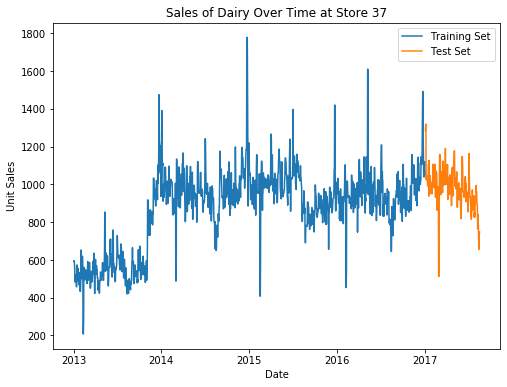

In [14]:
# Let's visualize training and test data for sales of dairy at store 37

import matplotlib.lines as mlines
plt.figure(figsize = (8,6))
plt.title('Sales of Dairy Over Time at Store 37')
plt.plot(store37_dairy_with_regressors_train['ds'], store37_dairy_with_regressors_train['y'])
plt.plot(store37_dairy_with_regressors_test['ds'], store37_dairy_with_regressors_test['y'])
plt.xlabel('Date')
plt.ylabel('Unit Sales')

blue_patch = mlines.Line2D([],[],color='#1f77b4', label='Training Set')
orange_patch = mlines.Line2D([],[],color='darkorange', label='Test Set')
plt.legend(handles=[blue_patch,orange_patch])
plt.savefig('bread.png')
plt.show()

In [15]:
# Initiate and fit model - adjusted hyperparameters (suggested to be done manually versus grid searching)
model = Prophet(changepoint_prior_scale = 0.01, changepoint_range = 1, yearly_seasonality=16, 
               weekly_seasonality=True, daily_seasonality=False, seasonality_mode='additive',
               seasonality_prior_scale=10, interval_width=0.8)
    
# Add regressors
model.add_regressor('holiday', prior_scale=0.5, mode = 'multiplicative')
model.add_regressor('avgtemp',prior_scale=0.5, mode = 'multiplicative')
model.add_regressor('precipMM',prior_scale=0.5, mode = 'multiplicative')
model.add_regressor('onpromotion',prior_scale=0.5, mode = 'multiplicative')

model.fit(store37_dairy_with_regressors_train)

forecast2 = model.predict(store37_dairy_with_regressors_test)

print('Optimized Prophet Test MAPE for dairy sales at store 37:',mean_absolute_percentage_error(y_true=store37_dairy_with_regressors_test['y'].values, y_pred=forecast2['yhat'].values))

Optimized Prophet Test MAPE for dairy sales at store 37: 6.963812411511504


Finding: some optimizing of the model hyperparamters reduced the MAPE for dairy sales at store 37 from 11% to 7.0%

In [16]:
# See what MAPE would be if we just do simple prediction of mean value from training set
forecast2['mean'] = store37_dairy_with_regressors_train['y'].mean()
print('Simple mean forecast Test MAPE for dairy sales at store 37:',mean_absolute_percentage_error(y_true=store37_dairy_with_regressors_test['y'].values, y_pred=forecast2['mean'].values))

Simple mean forecast Test MAPE for dairy sales at store 37: 12.909310039943975


Finding: my Prophet model has a 5.95% lower MAPE compared to the simple forecast method of just predicting with the mean value, reduced almost by half!

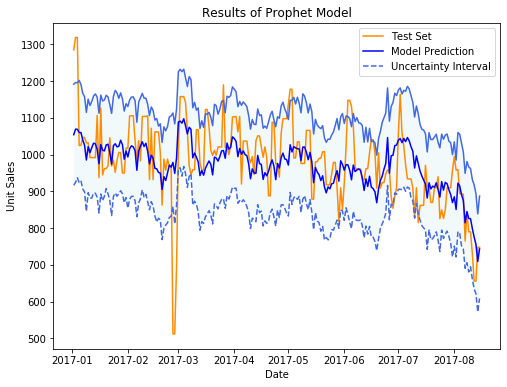

In [17]:
# Let's visualize the model predictions for the test set
plt.figure(figsize = (8,6))
plt.plot(store37_dairy_with_regressors_test['ds'], store37_dairy_with_regressors_test['y'].values, c='darkorange', label="Test Set")
plt.plot(store37_dairy_with_regressors_test['ds'], forecast2['yhat'].values, c="blue", label="Model Prediction")
plt.plot(store37_dairy_with_regressors_test['ds'], forecast2['yhat_lower'].values, c="royalblue", label="Uncertainty Interval", linestyle='--')
plt.plot(store37_dairy_with_regressors_test['ds'], forecast2['yhat_upper'].values, c="royalblue")

ax = plt.gca()
ax.fill_between(store37_dairy_with_regressors_test['ds'],  forecast2['yhat_lower'], forecast2['yhat_upper'], facecolor='lightblue', alpha=0.15, interpolate=True)
plt.title('Results of Prophet Model')
plt.xlabel('Date')
plt.ylabel('Unit Sales')
plt.legend()
plt.savefig('prophet.png')
plt.show();

Finding: It looks like the model predictions follow the actual test data fairly well, but there is one drop in the test data the model was not able to predict.

In [18]:
# Let's visualize the model over training and test data with interactive plotly figure
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

# add data back to forecast for visualization
future_all = model.make_future_dataframe(periods=len(store37_dairy_with_regressors_test), freq='1D')
frame = [future_all, holiday, avgtemp, precipMM, onpromotion]
future = pd.concat(frame, axis = 1)
future = future.drop(columns = ['date'])
forecast2 = model.predict(future)

fig = plot_plotly(model, forecast2, xlabel = 'Date', ylabel = 'Unit Sales')
py.iplot(fig)

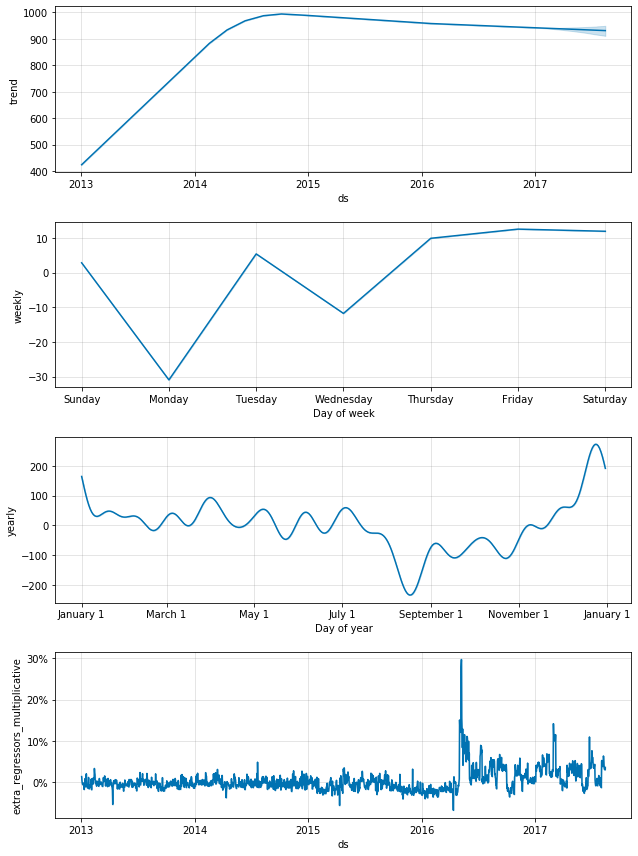

In [19]:
# Let's visualize the model components
components = model.plot_components(forecast2)

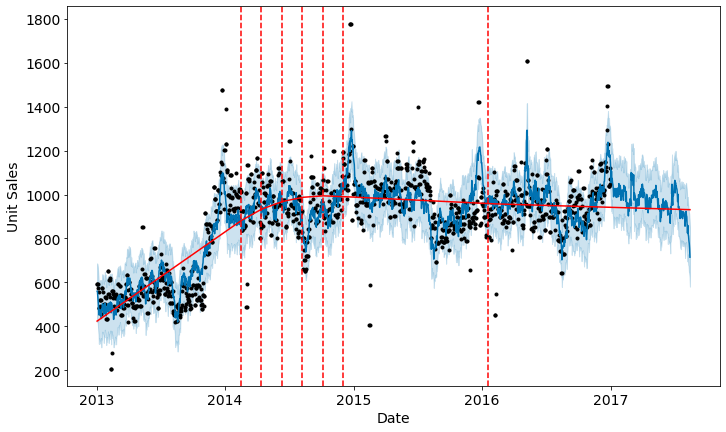

In [20]:
# Let's see where Prophet is making the trend changepoints in the training set
from fbprophet.plot import add_changepoints_to_plot

# make figure
fig_tanker=model.plot(forecast2)
a=add_changepoints_to_plot(fig_tanker.gca(),
                           model,
                           forecast2)
ax = fig_tanker.gca()
ax.grid(False)
ax.set_xlabel("Date", size=14)
ax.set_ylabel("Unit Sales", size=14)
ax.tick_params(axis="x", labelsize=14)
ax.tick_params(axis="y", labelsize=14)

INFO:fbprophet:Making 3 forecasts with cutoffs between 2015-01-06 00:00:00 and 2016-01-01 00:00:00


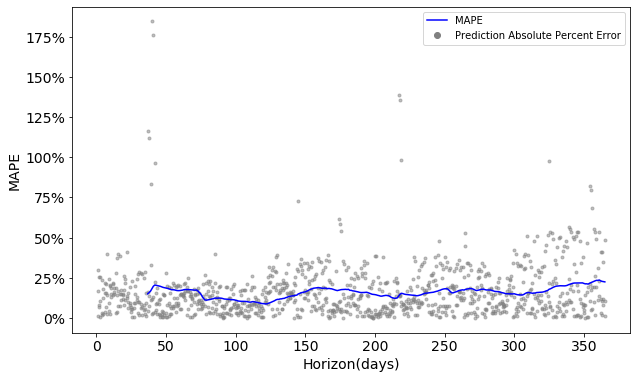

In [21]:
# Let's do some cross validation to see how well the model predicts with short- and long- term forecasts
df_cv = cross_validation(model, initial='730 days', period='180 days', horizon = '365 days')
df_p = performance_metrics(df_cv)

import matplotlib.ticker as mtick
fig = plot_cross_validation_metric(df_cv, metric='mape')
ax = fig.gca()
ax.grid(False)
ax.set_xlabel("Horizon(days)", size=14)
ax.set_ylabel("MAPE", size=14)
ax.tick_params(axis="x", labelsize=14)
ax.tick_params(axis="y", labelsize=14)
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

# Add custom legend
blue_patch = mlines.Line2D([],[],color='blue', label='MAPE')
grey_dot = mlines.Line2D([],[],marker = 'o', lw =0,  color='grey', label='Prediction Absolute Percent Error')
plt.legend(handles=[blue_patch,grey_dot])

In [22]:
df_p['mape'].describe()

count    329.000000
mean       0.159345
std        0.032712
min        0.087584
25%        0.139649
50%        0.160363
75%        0.178224
max        0.235815
Name: mape, dtype: float64

Finding: MAPE remains relatively stable whether the model is predicting short- or long- term forecasts